# Reads pattern

In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
from starmap.sequencing import *
from natsort import natsorted
from scipy.io import loadmat, savemat
from skimage.filters import threshold_otsu
from matplotlib.colors import ListedColormap
from tqdm import tqdm
import scanpy as sc
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 100

import plotly.express as px
import plotly.graph_objects as go
from skimage import data, filters, measure, morphology

In [2]:
from functools import wraps
from time import time

# Timer
def timer(func):
    @wraps(func)
    def _time_it(*args, **kwargs):
        start = int(round(time() * 1000))
        try:
            return func(*args, **kwargs)
        finally:
            end_ = int(round(time() * 1000)) - start
            end_ = round(end_ / 1000, 4)
            print(f"Total execution time: {end_ if end_ > 0 else 0} s")
    return _time_it


@timer
# Load reads and their positions from mat file
def load_reads(fpath, reads_file):
    S = loadmat(os.path.join(fpath, reads_file))
    bases = [str(i[0][0]) for i in S["merged_reads"]]
    points = S["merged_points"][:, :2]
    temp = np.zeros(points.shape)
    temp[:, 0] = np.round(points[:, 1]-1)
    temp[:, 1] = np.round(points[:, 0]-1)
    
    print(f"Number of reads: {len(bases)}")
    
    return bases, temp


# Load gene table from genes.csv
def load_genes(fpath):
    genes2seq = {}
    seq2genes = {}
    with open(os.path.join(fpath, "genes.csv"), encoding='utf-8-sig') as f:
        for l in f:
            fields = l.rstrip().split(",")
            genes2seq[fields[0]] = "".join([str(s+1) for s in encode_SOLID(fields[1][::-1])])
            seq2genes[genes2seq[fields[0]]] = fields[0]
    return genes2seq, seq2genes

## Check Gfap distribution

In [3]:
# IO path 
base_path = './'
out_path = os.path.join(base_path, 'output')
if not os.path.exists(out_path):
    os.mkdir(out_path)
    
sample_dirs = [d for d in os.listdir(base_path) if d.startswith("AD")]
sample_dirs

['AD_mouse9721', 'AD_mouse9781', 'AD_mouse9919', 'AD_mouse9930']

In [26]:
# Iterate through each sample dir
current_dir = sample_dirs[2]
# print(test_dir)


print(f"Current sample: {current_dir}")


# Load reads 
bases, points = load_reads(current_dir, "goodPoints.mat")
bases = np.array(bases)
points = np.array(points)

# Load genes
genes2seqs, seqs2genes = load_genes(base_path)

Current sample: AD_mouse9919
Number of reads: 5721666
Total execution time: 33.464 s


## Use scaled images

In [27]:
# Figure parameter
plt.rcParams['savefig.dpi'] = 100

In [28]:
# Load background image 
# overlay = load_nissl_image(os.path.join(current_dir), fname="overlay.tif")
overlay = load_nissl_image(os.path.join(current_dir, "scaled"), fname="pi_blue.tif")

# Load cell segmentation img
seg = load_nissl_image(os.path.join(current_dir, "scaled"), fname="labeled_cells.tif")

# Load Gfap img
gfap = load_nissl_image(os.path.join(current_dir, "scaled"), fname="Gfap_mask.tif")
#gfap_threshold = threshold_otsu(gfap)
#gfap = gaussian(gfap.astype(np.float), 1) > gfap_threshold

# scaled points 
points = points * 0.3

In [29]:
genes = ['GFAP']

figsize = (overlay.shape[1] / 100, overlay.shape[0] / 100)

fig, ax = plt.subplots(figsize=figsize)

ax.imshow(overlay, interpolation=None, zorder=0)
masked = np.ma.masked_where(gfap == 0, gfap)
gfap_cmap = sns.color_palette(['#00ff11', '#000000'])
gfap_cmap = ListedColormap(gfap_cmap)
plt.imshow(masked, gfap_cmap, interpolation='none', alpha=.8, zorder=1)

for i, gene in enumerate(genes):
        print(gene)
        
        curr_index = np.argwhere(bases == genes2seqs[gene]).flatten()
        curr_points = points[curr_index, :]
        n_reads = curr_points.shape[0]

        # Plot reads
        plt.plot(curr_points[:, 1], curr_points[:, 0], '.', color='red', markersize=1)
        
plt.axis('off')
plt.tight_layout()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
figure_path = os.path.join(out_path, f"{current_dir}_test.tif")
plt.savefig(figure_path)
plt.clf()
plt.close()
        
# plt.show()

GFAP


In [30]:
# Load cell segmentation img
seg = load_nissl_image(os.path.join(current_dir, "scaled"), fname="labeled_cells.tif")

# Load background image 
bk_img = load_nissl_image(os.path.join("output"), fname=f"{current_dir}_test.tif")

# Load Gfap img
plaque = load_nissl_image(os.path.join(current_dir, "scaled"), fname="plaque.tif")
# gfap_threshold = threshold_otsu(plaque)
plaque = gaussian(plaque.astype(np.float), 2) > 30

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # Remove the CWD from sys.path while we load stuff.


In [31]:
# Load adata 
adata = sc.read_h5ad('output/2021-04-22-starmap-mAD-64-genes-raw.h5ad')
adata

AnnData object with n_obs × n_vars = 36625 × 64
    obs: 'orig_index', 'sample', 'area', 'tau', 'gfap', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'predicted_top_level', 'predicted_top_level_score', 'predicted_cell_type', 'predicted_cell_type_score', 'predicted_cell_type_label', 'predicted_cell_type_label_score', 'leiden', 'top_level'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9721_morph', 'AD_mouse9781_morph', 'AD_mouse9919_morph', 'AD_mouse9930_morph', 'top_hex_dict_64', 'top_level_order_64', 'top_rgb_dict_64'

In [32]:
obs = adata.obs.loc[adata.obs['sample'] == current_dir, :]

M = seg.shape[0]//30
N = seg.shape[1]//30

tiles = [(x, x+M, y, y+N) for x in range(0,seg.shape[0],M) for y in range(0,seg.shape[1],N)]

# contours = []
props_dict = {}
props = measure.regionprops(seg)
for i, region in enumerate(props):
    props_dict[region.label] = i
    
figsize = (seg.shape[1] / 100, seg.shape[0] / 100)
fig, ax = plt.subplots(figsize=figsize)

ax.imshow(bk_img)

masked_plaque = np.ma.masked_where(plaque == 0, plaque)

plaque_cmap = sns.color_palette(['#ffffff', '#000000'])
plaque_cmap = ListedColormap(plaque_cmap)
plt.imshow(masked_plaque, plaque_cmap, interpolation='none', alpha=.5)


for i, tile in enumerate(tqdm(tiles)):
    current_tile = seg[tile[0]:tile[1], tile[2]:tile[3]]
    for j, region in enumerate(regionprops(current_tile)):
        label = region.label
        contour = measure.find_contours(current_tile == label, .9)
        if contour:
            contour = contour[0]
            # offset 
            contour[:,0] = contour[:,0] + tile[0]
            contour[:,1] = contour[:,1] + tile[2]
            #color.append(0)
            #contours.append(contour)
            top_level = obs.loc[obs['orig_index'] == props_dict[label], 'top_level'].to_list()
            if top_level == ['Astro']:
                color = adata.uns['top_hex_dict_64'][top_level[0]]
                ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c=color)
        
plt.axis('off')
plt.tight_layout()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
figure_path = os.path.join(out_path, f"{current_dir}_contour_Astro.tif")
plt.savefig(figure_path, bbox_inches = 'tight', pad_inches = 0)
plt.clf()
plt.close()
        
# plt.show()

100%|██████████| 961/961 [00:12<00:00, 78.01it/s] 


## Test

In [10]:
# # Load dapi label
# pi_label = load_label_image(os.path.join(current_dir, "scaled"), fname='pi_label.tif')

# Load background image 
# overlay = load_nissl_image(os.path.join(current_dir), fname="overlay.tif")
overlay = load_nissl_image(os.path.join(current_dir, "trimmed_images"), fname="pi.tif")

# Load cell segmentation img
seg = load_nissl_image(os.path.join(current_dir, "segmentation"), fname="labeled_cells.tif")

# # Load tau img
# tau = load_nissl_image(os.path.join(current_dir, "scaled"), fname="tau.tif")
# tau = gaussian(tau.astype(np.float), 2) > 50

# Load Gfap img
gfap = load_nissl_image(os.path.join(current_dir, "trimmed_images"), fname="Gfap.tif")
gfap_threshold = threshold_otsu(gfap)
gfap = gaussian(gfap.astype(np.float), 1) > gfap_threshold

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [ ]:
genes = ['GFAP']

figsize = (overlay.shape[1] / 100, overlay.shape[0] / 100)

fig, ax = plt.subplots(figsize=figsize)

ax.imshow(overlay, cmap='gray', interpolation=None, zorder=0)
masked = np.ma.masked_where(gfap == 0, gfap)
gfap_cmap = sns.color_palette(['#00ff11', '#000000'])
gfap_cmap = ListedColormap(gfap_cmap)
plt.imshow(masked, gfap_cmap, interpolation='none', alpha=.8, zorder=1)

for i, gene in enumerate(genes):
        print(gene)
        
        curr_index = np.argwhere(bases == genes2seqs[gene]).flatten()
        curr_points = points[curr_index, :]
        n_reads = curr_points.shape[0]

        # Plot reads
        plt.plot(curr_points[:, 1], curr_points[:, 0], '.', color='red', markersize=4)
        
plt.axis('off')
plt.tight_layout()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
figure_path = os.path.join(out_path, f"{current_dir}.tif")
plt.savefig(figure_path)
plt.clf()
plt.close()
        
# plt.show()

GFAP


## Test

In [204]:
# Load cell segmentation img
seg = load_nissl_image(os.path.join(current_dir, "scaled"), fname="labeled_cells.tif")

# Load background image 
overlay = load_nissl_image(os.path.join(current_dir, "scaled"), fname="overlay.tif")

# seg = seg[:2000, :2000]
# overlay = overlay[:2000, :2000]

100%|██████████| 235/235 [00:01<00:00, 164.21it/s]



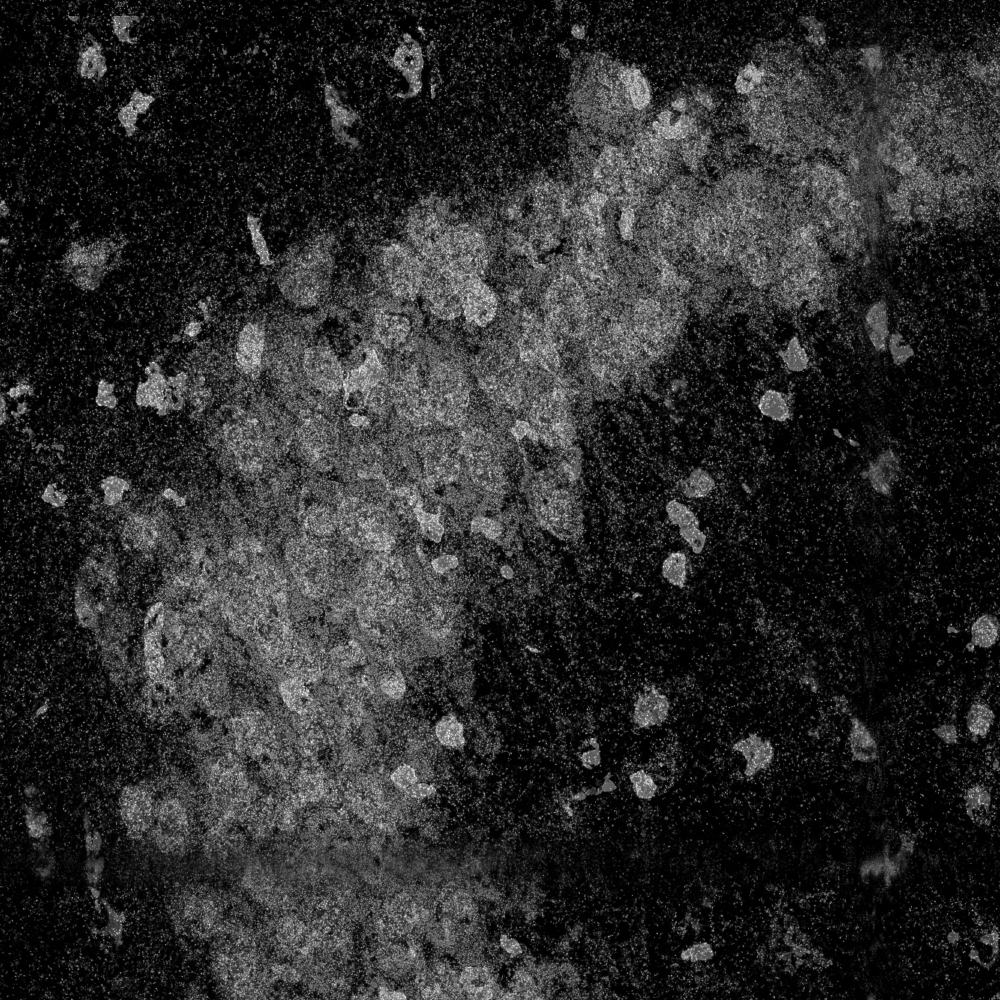

In [155]:
import plotly.express as px
import plotly.graph_objects as go
from skimage import data, filters, measure, morphology

# img = data.coins()
# # Binary image, post-process the binary mask and compute labels
# threshold = filters.threshold_otsu(img)
# mask = img > threshold
# mask = morphology.remove_small_objects(mask, 50)
# mask = morphology.remove_small_holes(mask, 50)
# labels = measure.label(mask)

fig = px.imshow(overlay, binary_string=True)
fig.update_traces(hoverinfo='skip') # hover is only for label info

props = measure.regionprops(seg, overlay)
properties = ['area', 'mean_intensity']

# For each label, add a filled scatter trace for its contour,
# and display the properties of the label in the hover of this trace.
# for index in range(1, seg.max()):
#     label = props[index].label
#     contour = measure.find_contours(seg == label, 0.5)[0]
#     y, x = contour.T
#     hoverinfo = ''
#     for prop_name in properties:
#         hoverinfo += f'<b>{prop_name}: {getattr(props[index], prop_name):.2f}</b><br>'
#     fig.add_trace(go.Scatter(
#         x=x, y=y, name=label,
#         mode='lines', fill='toself', showlegend=False,
#         hovertemplate=hoverinfo, hoveron='points+fills'))

# for index in range(1, seg.max()):
for i, region in enumerate(tqdm(regionprops(seg))):
    label = region.label
    contour = measure.find_contours(seg == label, 0.5)[0]
    y, x = contour.T
    hoverinfo = ''
    for prop_name in properties:
        hoverinfo += f'<b>{prop_name}: {getattr(props[i], prop_name):.2f}</b><br>'
    fig.add_trace(go.Scatter(
        x=x, y=y, name=label, line_width=1,
        mode='lines', fill='toself', showlegend=False,
        hovertemplate=hoverinfo, hoveron='points+fills'))

    
fig

In [156]:
figure_path = os.path.join(out_path, f"interact.html")
fig.write_html(figure_path)

In [176]:
seg.shape

(2000, 2000)

100%|██████████| 600/600 [00:07<00:00, 78.75it/s]


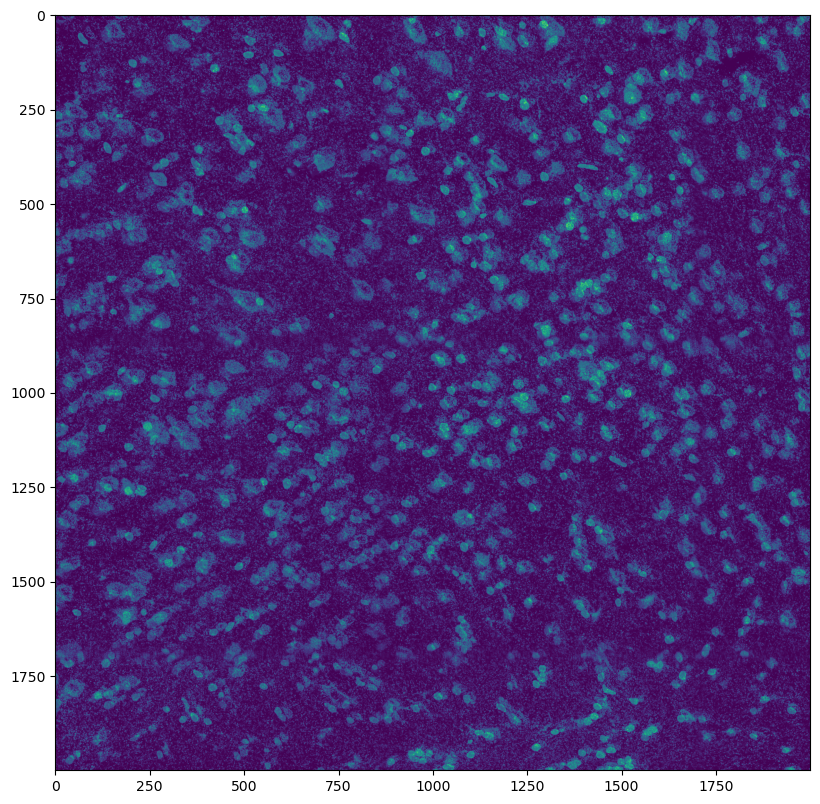

In [185]:
fig, ax = plt.subplots(figsize=(10,10))

ax.imshow(overlay)

color = []
contours = []
seg_part_1 = seg[:1000, :]
for i, region in enumerate(tqdm(regionprops(seg_part_1))):
    label = region.label
    contour = measure.find_contours(seg_part_1 == label, .9)[0]
    color.append(0)
    contours.append(contour)
    # ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='#f00000')
    
seg_part_2 = seg[900:, :]
for i, region in enumerate(tqdm(regionprops(seg_part_2))):
    label = region.label
    contour = measure.find_contours(seg_part_2 == label, .9)[0]
    contour[:,0] = contour[:,0] + 900
    color.append(1)
    contours.append(contour)
    # ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='#4ef542')
    
    
#ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='#4ef542')
#plt.show()

100%|██████████| 49/49 [01:01<00:00,  1.25s/it]


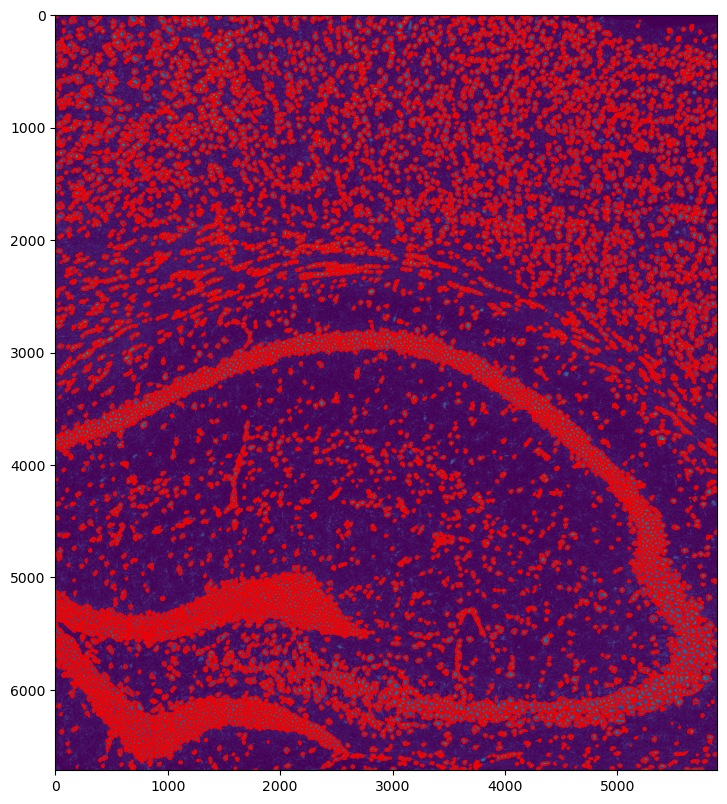

In [207]:
M = seg.shape[0]//6
N = seg.shape[1]//6

tiles = [(x, x+M, y, y+N) for x in range(0,seg.shape[0],M) for y in range(0,seg.shape[1],N)]

contours = []

fig, ax = plt.subplots(figsize=(10,10))

ax.imshow(overlay)

for i, tile in enumerate(tqdm(tiles)):
    current_tile = seg[tile[0]:tile[1], tile[2]:tile[3]]
    for j, region in enumerate(regionprops(current_tile)):
        label = region.label
        contour = measure.find_contours(current_tile == label, .9)[0]
        # offset 
        contour[:,0] = contour[:,0] + tile[0]
        contour[:,1] = contour[:,1] + tile[2]
        #color.append(0)
        #contours.append(contour)
        ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c='#f00000')

In [216]:
fig = px.imshow(overlay, binary_string=True)
fig.update_traces(hoverinfo='skip') # hover is only for label info

props_dict = {}
props = measure.regionprops(seg, overlay)
for region in props:
    props_dict[region.label] = region
properties = ['area', 'mean_intensity']

for i, tile in enumerate(tqdm(tiles)):
    current_tile = seg[tile[0]:tile[1], tile[2]:tile[3]]
    for j, region in enumerate(regionprops(current_tile)):
        label = region.label
        contour = measure.find_contours(current_tile == label, 0.5)[0]
        # offset 
        contour[:,0] = contour[:,0] + tile[0]
        contour[:,1] = contour[:,1] + tile[2]
        y, x = contour.T
        hoverinfo = ''
        for prop_name in properties:
            hoverinfo += f'<b>{prop_name}: {getattr(props_dict[label], prop_name):.2f}</b><br>'
        fig.add_trace(go.Scatter(
            x=x, y=y, name=label, line_width=1,
            mode='lines', fill='toself', showlegend=False,
            hovertemplate=hoverinfo, hoveron='points+fills'))

figure_path = os.path.join(out_path, f"interact.html")
fig.write_html(figure_path)

100%|██████████| 49/49 [01:24<00:00,  1.73s/it]


## With cell type

In [6]:
# Load cell segmentation img
seg = load_nissl_image(os.path.join(current_dir, "segmentation"), fname="labeled_cells.tif")

# Load background image 
bk_img = load_nissl_image(os.path.join("output"), fname=f"{current_dir}.tif")

# Load Gfap img
plaque = load_nissl_image(os.path.join(current_dir, "trimmed_images"), fname="plaque.tif")
# gfap_threshold = threshold_otsu(plaque)
plaque = gaussian(plaque.astype(np.float), 2) > 30

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # Remove the CWD from sys.path while we load stuff.


In [7]:
# Load adata 
adata = sc.read_h5ad('output/2021-04-22-starmap-mAD-64-genes-raw.h5ad')
adata

AnnData object with n_obs × n_vars = 36625 × 64
    obs: 'orig_index', 'sample', 'area', 'tau', 'gfap', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'predicted_top_level', 'predicted_top_level_score', 'predicted_cell_type', 'predicted_cell_type_score', 'predicted_cell_type_label', 'predicted_cell_type_label_score', 'leiden', 'top_level'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9721_morph', 'AD_mouse9781_morph', 'AD_mouse9919_morph', 'AD_mouse9930_morph', 'top_hex_dict_64', 'top_level_order_64', 'top_rgb_dict_64'

In [8]:
obs = adata.obs.loc[adata.obs['sample'] == current_dir, :]

M = seg.shape[0]//30
N = seg.shape[1]//30

tiles = [(x, x+M, y, y+N) for x in range(0,seg.shape[0],M) for y in range(0,seg.shape[1],N)]

# contours = []
props_dict = {}
props = measure.regionprops(seg)
for i, region in enumerate(props):
    props_dict[region.label] = i
    
figsize = (seg.shape[1] / 100, seg.shape[0] / 100)
fig, ax = plt.subplots(figsize=figsize)

ax.imshow(bk_img)

masked_plaque = np.ma.masked_where(plaque == 0, plaque)

plaque_cmap = sns.color_palette(['#ffffff', '#000000'])
plaque_cmap = ListedColormap(plaque_cmap)
plt.imshow(masked_plaque, plaque_cmap, interpolation='none', alpha=.5)


for i, tile in enumerate(tqdm(tiles)):
    current_tile = seg[tile[0]:tile[1], tile[2]:tile[3]]
    for j, region in enumerate(regionprops(current_tile)):
        label = region.label
        contour = measure.find_contours(current_tile == label, .9)
        if contour:
            contour = contour[0]
            # offset 
            contour[:,0] = contour[:,0] + tile[0]
            contour[:,1] = contour[:,1] + tile[2]
            #color.append(0)
            #contours.append(contour)
            top_level = obs.loc[obs['orig_index'] == props_dict[label], 'top_level'].to_list()
            if top_level == ['Astro']:
                color = adata.uns['top_hex_dict_64'][top_level[0]]
                ax.plot(contour[:, 1], contour[:, 0], linewidth=1, c=color)
        
plt.axis('off')
plt.tight_layout()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
figure_path = os.path.join(out_path, f"{current_dir}_contour_Astro.tif")
plt.savefig(figure_path, bbox_inches = 'tight', pad_inches = 0)
plt.clf()
plt.close()
        
# plt.show()

100%|██████████| 961/961 [00:50<00:00, 19.06it/s]


In [9]:
figure_path

'./output/AD_mouse9919_contour_Astro.tif'

## Density test

In [330]:
obs

,orig_index,sample,area,tau,x,y,time,group,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,n_genes,n_counts,predicted_top_level,predicted_top_level_score,predicted_cell_type,predicted_cell_type_score,predicted_cell_type_label,predicted_cell_type_label_score
31123,0,AD_mouse9930,4997,0.0,4168,7,13_months,control,24,3.218876,95.0,4.564348,24,95.0,Endo,0.337181,Oligo,0.295064,OL1,0.295064
31124,1,AD_mouse9930,5547,0.0,4545,5,13_months,control,25,3.258097,102.0,4.634729,25,102.0,Ex,0.716036,L2/3,0.626078,CTX-Ex1,0.626078
31125,2,AD_mouse9930,11679,0.0,2814,13,13_months,control,39,3.688879,228.0,5.433722,39,228.0,Ex,0.476083,L6,0.234783,CTX-Ex4,0.234783
31126,3,AD_mouse9930,9412,0.0,3149,9,13_months,control,32,3.496508,211.0,5.356586,32,211.0,Ex,0.902279,L4/5_RSC_A,0.607698,CTX-Ex2,0.607698
31127,4,AD_mouse9930,6667,0.0,3631,8,13_months,control,29,3.401197,136.0,4.919981,29,136.0,Ex,0.767152,L2/3,0.617823,CTX-Ex1,0.617823
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,9821,AD_mouse9930,11834,0.0,5693,6707,13_months,control,21,3.091042,212.0,5.361292,21,212.0,Oligo,0.950427,Oligo,0.714561,OL1,0.714561
40945,9822,AD_mouse9930,5996,0.0,2841,6708,13_months,control,18,2.944439,75.0,4.330733,18,75.0,Oligo,0.940241,Oligo,0.828848,OL1,0.828848
40946,9823,AD_mouse9930,12296,0.0,3628,6706,13_months,control,23,3.178054,136.0,4.919981,23,136.0,SMC,0.865144,Peri_B,0.476244,S3,0.476244
40947,9824,AD_mouse9930,8930,0.0,5742,6705,13_months,control,19,2.995732,172.0,5.153292,19,172.0,Oligo,0.992701,Oligo,0.586381,OL1,0.586381


In [332]:
(obs['orig_index'] == 0).index

Index(['31123', '31124', '31125', '31126', '31127', '31129', '31130', '31131',
       '31132', '31134',
       ...
       '40939', '40940', '40941', '40942', '40943', '40944', '40945', '40946',
       '40947', '40949'],
      dtype='object', length=8655)

In [349]:
sdata = adata[adata.obs['sample'] == current_dir, :]

a = sdata[sdata.obs['orig_index'] == '9826', 'GFAP'].X.sum().copy()
a

array(0., dtype=float32)

In [367]:
sdata.obs['orig_index']

31123       0
31124       1
31125       2
31126       3
31127       4
         ... 
40944    9821
40945    9822
40946    9823
40947    9824
40949    9826
Name: orig_index, Length: 8655, dtype: int64

In [368]:
# Libraries
data = np.zeros(seg.shape)
sdata = adata[adata.obs['sample'] == current_dir, :]

for i, region in enumerate(regionprops(seg)):
    if i in sdata.obs['orig_index'].to_list():
    # if i == 0:
        print(i)
        expr = sdata[sdata.obs['orig_index'] == i, 'GFAP'].X.copy()
        data[region.coords[:, 0], region.coords[:, 1]] = expr
        # print(region.coords.shape)

0
1
2
3
4
6
7
8
9
11
13
14
15
16
17
18
19
20
21
22
23
24
25
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
65
66


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

67
68
69
70
71
72
73
75
76
77
78
79
80
82
83
84
85
86
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
110
111
112
113
114
115
117
118
119
120
121
122
123
125
126
127
128


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

129
130
131
132
133
134
135
136
137
138
140
141
142
143
144
145
146
147
148
149
150
151
152
156
157
159
160
161
163
164
165
166
167
169
170
172
173
174
175
176
178
179
180
181
182
183
184
187
189
190
191
192
193
195
196
198
199
200
201
202


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

203
204
205
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
224
225
226
227
229
230
231
232
233
235
236
237
238
239
240
241
243
244
245
246
247
248
249
250
252
253
254
255
256
257
258
259
260
261
262
263


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

264
266
267
268
269
270
271
275
276
277
278
279
280
281
282
283
285
286
287
288
289
290
292
293
294
295
296
297
298
299
301
302
303
304
305
306
307
308
310
311
312
313
314
315
316
317
318
319
320
321
323
324
325
326
327
328
329
330
331


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
349
350
351
352
353
354
355
357
358
359
360
361
362
363
364
365
366
368
369
370
371
372
374
375
376
377
378
379
380
381
382
383
384
385
386


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

387
388
390
391
392
393
394
395
396
397
398
399
400
401
402
404
405
406
407
409
410
411
412
413
414
415
416
417
418
419
420
421
422
423
424
425
426
427
428
429
430
431
432
433
434
435
436
438
439
441
442
444
445
446
447
448
449
450


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

451
452
453
454
455
456
457
458
459
460
461
462
463
464
465
466
467
468
469
470
471
472
473
474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
496
497
498
499
500
501
502
503
504
505
506
507
508
509
510
511


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

513
515
516
517
518
519
520
521
522
523
524
526
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
548
549
550
551
552
553
554
555
556
558
559
560
561
562
563
564
565
566
567
568
569
570
571
572
573
574
575


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

576
577
578
579
580
581
582
583
584
585
587
588
590
591
592
593
594
595
596
597
598
599
600
601
602
603
604
605
606
607
608
609
610
611
612
613
614
615
616
617
618
619
621
622
623
624
625
626
628
629
631
632


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

633
634
635
636
637
638
639
640
641
643
644
645
646
647
648
649
650
651
652
653
654
655
656
657
658
661
662
663
664
665
666
667
668
669
670
671
672
673
674
675
676
677
678
680
681
682
683
684
685
686
687
688
689
691


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

692
693
694
695
696
697
698
699
700
701
702
703
704
705
706
708
709
710
711
712
713
714
715
716
717
718
719
720
722
723
724
725
726
727
728
729
730
731
732
735
736
737
738
740
741
742
743
744
745
746
747
748
749
750


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

751
752
753
754
755
756
757
758
759
760
762
763
764
765
766
768
769
770
771
773
774
775
776
778
779
780
782
783
784
786
787
788
789
790
791
792
793
795
796
797
798
799
800
801
802
803
804
806
807
808
809
810
811
812
813


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

814
815
816
818
819
820
821
822
823
824
825
827
828
829
830
832
833
834
835
836
837
839
840
845
846
847
848
849
850
851
852
853
854
855
856
857
858
860
861
862
863
864
866
867
868
869
870
871
873
874
875
876
877
878
879
880
881
882
883
884


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

885
886
887
888
889
890
892
893
894
895
896
897
898
899
900
901
902
903
904
905
906
908
909
910
911
912
913
914
915
916
917
918
920
921
922
923
924
925
926
927
928
929
930
931
932
933
934
935
936
937
938
940
941
942
943
944
945
946
947
948


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

949
950
951
952
953
954
956
957
958
959
960
961
962
964
965
966
967
968
969
971
972
973
974
975
976
977
978
979
980
981
982
983
984
985
986
987
988
990
991
992
993
994
995
996
997
998
999
1000
1001
1003
1005
1006
1007
1008
1009
1010
1011
1012
1013


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1014
1015
1016
1017
1018
1019
1020
1021
1022
1023
1024
1025
1026
1027
1028
1029
1030
1033
1034
1035
1036
1037
1039
1040
1041
1042
1043
1044
1045
1046
1047
1048
1049
1050
1051
1052
1053
1054
1055
1056
1057
1058
1059
1060
1061
1062
1063
1065
1066
1067
1068
1069
1070
1071
1072
1073
1074
1075
1076


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1078
1079
1080
1081
1082
1083
1084
1085
1086
1087
1088
1089
1090
1091
1092
1093
1094
1095
1096
1097
1098
1099
1100
1101
1102
1103
1104
1105
1107
1108
1109
1110
1111
1112
1113
1114
1115
1117
1118
1119
1120
1121
1122
1123
1124
1125
1126
1127
1129
1131
1132
1133
1134
1135
1136
1137
1138
1139
1140
1141
1142


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1143
1144
1145
1146
1147
1148
1149
1151
1152
1153
1154
1155
1156
1157
1158
1159
1160
1161
1162
1163
1164
1165
1166
1167
1168
1169
1170
1171
1172
1173
1174
1175
1176
1177
1178
1179
1181
1182
1183
1184
1185
1187
1188
1189
1190
1191
1193
1194
1195
1196
1197
1198
1199
1201
1202
1203
1204
1205
1206


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1207
1208
1209
1210
1211
1212
1213
1214
1215
1216
1217
1218
1219
1220
1223
1224
1225
1228
1229
1231
1232
1233
1234
1236
1237
1238
1240
1241
1242
1243
1244
1245
1246
1247
1248
1249
1251
1252
1253
1254
1255
1256
1257
1260
1261
1262
1263
1264
1265
1266
1269
1270
1272
1273
1274
1275
1276
1279
1280
1281
1282


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1283
1284
1285
1286
1287
1288
1289
1290
1291
1292
1293
1294
1295
1296
1297
1298
1299
1300
1302
1303
1304
1305
1306
1307
1308
1309
1310
1311
1312
1313
1315
1316
1317
1318
1319
1320
1321
1322
1324
1325
1326
1327
1328
1329
1331
1332
1333
1334
1335
1336
1337
1338
1340
1342
1343
1344
1345
1346
1347
1348
1350
1351
1353


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1354
1355
1356
1357
1359
1360
1361
1362
1363
1364
1365
1366
1367
1368
1369
1371
1373
1374
1375
1376
1378
1379
1380
1381
1383
1384
1385
1386
1387
1389
1390
1392
1393
1394
1396
1397
1398
1399
1400
1401
1402
1404
1405
1406
1407
1408
1409
1410
1411
1412
1413
1414
1415
1416
1417
1418
1419
1420
1421
1422


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1423
1424
1425
1426
1427
1428
1429
1430
1431
1432
1433
1434
1435
1436
1437
1438
1439
1440
1441
1442
1443
1444
1445
1447
1448
1449
1450
1451
1452
1453
1455
1457
1458
1459
1460
1461
1462
1463
1464
1465
1466
1467
1468
1469
1470
1471
1472
1473
1474
1475
1476
1478
1479
1480
1481
1482
1483
1485
1487
1488
1489


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1490
1491
1492
1493
1494
1495
1496
1499
1500
1501
1502
1503
1504
1505
1506
1507
1508
1509
1510
1511
1512
1513
1515
1516
1517
1518
1519
1520
1521
1522
1523
1524
1525
1526
1527
1529
1530
1531
1532
1533
1535
1536
1537
1538
1539
1540
1541
1544
1545
1546
1548
1549
1550
1551
1553
1555
1556
1557
1558


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1559
1560
1561
1562
1563
1564
1565
1567
1569
1570
1571
1572
1573
1574
1575
1577
1578
1579
1580
1581
1582
1583
1584
1585
1586
1587
1588
1589
1590
1591
1592
1594
1595
1596
1597
1598
1600
1601
1602
1603
1604
1605
1606
1607
1609
1610
1611
1612
1614
1615
1616
1617
1618
1619
1620
1621
1622
1623
1624
1625


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1626
1627
1628
1629
1630
1631
1632
1633
1634
1635
1636
1639
1640
1641
1642
1643
1644
1645
1646
1647
1648
1649
1650
1652
1653
1654
1655
1656
1657
1659
1660
1662
1663
1664
1665
1666
1668
1670
1671
1672
1673
1674
1675
1676
1677
1678
1679
1680
1681
1682
1683
1684
1685
1686
1687
1688
1689
1690
1691
1692
1693


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1694
1695
1697
1699
1700
1701
1702
1703
1704
1705
1706
1707
1708
1709
1710
1711
1712
1714
1715
1716
1717
1718
1719
1720
1721
1722
1723
1724
1725
1726
1727
1729
1730
1731
1732
1733
1734
1735
1736
1738
1739
1740
1741
1742
1743
1744
1745
1746
1747
1748
1749
1750
1751
1752
1753
1754
1755
1756


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1757
1758
1759
1760
1761
1762
1763
1764
1765
1766
1767
1768
1772
1773
1774
1775
1776
1777
1778
1779
1780
1781
1783
1784
1785
1786
1787
1788
1789
1791
1792
1793
1794
1795
1796
1797
1798
1799
1800
1801
1802
1803
1804
1805
1806
1807
1809
1810
1811
1812
1813
1814
1815
1816
1817
1818
1819
1820
1821


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1822
1823
1824
1825
1827
1828
1829
1831
1832
1833
1834
1835
1836
1837
1838
1839
1840
1841
1842
1843
1845
1846
1847
1848
1849
1850
1851
1852
1853
1854
1855
1856
1857
1858
1860
1861
1863
1864
1865
1866
1867
1870
1871
1872
1873
1874
1877
1878
1879
1880
1881
1882
1883
1885
1887
1888
1889
1890
1891
1892


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1893
1895
1896
1897
1898
1901
1902
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1937
1938
1939
1940
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1954
1955
1957
1958
1959
1960
1961
1962
1963


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

1964
1965
1966
1968
1969
1970
1971
1972
1973
1974
1976
1977
1978
1979
1980
1981
1982
1983
1984
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2022
2023
2024
2026
2027
2028
2029
2030


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2031
2032
2033
2034
2035
2037
2038
2039
2040
2041
2042
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2062
2063
2064
2065
2066
2067
2068
2071
2072
2073
2074
2075
2076
2077
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2095
2096
2097
2098


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2124
2126
2127
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2148
2149
2150
2151
2152
2153
2154
2155
2157
2158
2159
2160


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2195
2196
2197
2198
2199
2200
2201
2202
2204
2205
2206
2207
2208
2209
2210
2211
2213
2214
2215
2216
2217
2218
2219
2220
2221
2222
2223
2224
2225


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2226
2227
2228
2229
2230
2231
2232
2233
2235
2236
2237
2238
2239
2240
2241
2242
2243
2245
2246
2247
2248
2250
2251
2252
2253
2254
2255
2256
2257
2258
2260
2262
2263
2264
2265
2266
2267
2268
2269
2270
2271
2272
2273
2274
2275
2278
2279
2280
2281
2282
2284
2285
2286
2287
2288
2289
2291
2292
2293
2294
2295
2298
2299
2300


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2301
2302
2303
2304
2305
2307
2308
2309
2310
2311
2313
2315
2316
2317
2318
2319
2320
2321
2322
2323
2324
2325
2328
2329
2330
2331
2332
2333
2334
2336
2337
2338
2339
2340
2341
2342
2343
2344
2346
2347
2348
2349
2350
2351
2352
2353
2354
2355
2359
2360
2361
2362
2363
2364
2365
2366
2367
2368
2369
2370
2371


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2372
2373
2374
2375
2376
2377
2378
2379
2380
2381
2382
2383
2384
2385
2386
2387
2388
2389
2390
2391
2392
2393
2394
2395
2396
2397
2398
2399
2403
2404
2406
2407
2408
2409
2410
2411
2412
2413
2414
2415
2417
2418
2419
2421
2422
2423
2424
2425
2426
2427
2428
2429
2430
2432
2433
2434
2435
2436
2437
2438


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2439
2440
2441
2442
2443
2444
2445
2447
2452
2453
2454
2455
2456
2457
2458
2460
2461
2462
2464
2465
2466
2467
2468
2469
2470
2471
2472
2473
2474
2476
2477
2479
2481
2482
2484
2485
2486
2487
2488
2489
2490
2492
2493
2494
2495
2496
2497
2498
2499
2500
2501
2502
2503
2504
2505
2506
2508
2509
2512
2513
2514


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2516
2518
2521
2522
2523
2524
2525
2526
2527
2528
2529
2531
2532
2533
2534
2535
2536
2537
2539
2540
2541
2542
2543
2544
2545
2546
2547
2548
2549
2551
2552
2553
2554
2555
2557
2558
2559
2560
2561
2562
2563
2564
2565
2566
2567
2569
2570
2571
2572
2573
2574
2576
2577
2578
2579
2580
2581
2582
2583
2584
2585
2586
2587


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2588
2589
2590
2591
2594
2595
2596
2597
2598
2599
2600
2601
2603
2604
2606
2607
2608
2609
2611
2612
2613
2615
2617
2618
2619
2621
2623
2624
2627
2628
2629
2631
2632
2633
2634
2635
2636
2637
2638
2640
2641
2642
2643
2644
2645
2646
2647
2648
2649
2651
2652
2653
2654
2655
2656
2657
2658
2660
2662
2663
2664
2665
2666
2667
2668


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2669
2670
2671
2672
2673
2674
2676
2677
2680
2681
2682
2683
2686
2687
2688
2689
2690
2691
2693
2694
2695
2696
2697
2698
2699
2701
2702
2704
2706
2707
2709
2710
2711
2713
2714
2715
2717
2718
2719
2721
2722
2723
2724
2725
2726
2729
2730
2731
2732
2734
2735
2736
2737
2738
2739
2740
2741
2742
2743
2744
2745
2746


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2747
2748
2749
2752
2753
2754
2755
2756
2757
2760
2761
2762
2763
2764
2765
2767
2768
2769
2770
2772
2773
2774
2775
2776
2778
2779
2780
2781
2782
2783
2784
2785
2786
2787
2788
2789
2791
2792
2794
2795
2796
2798
2799
2801
2802
2803
2804
2805
2806
2807
2808
2809
2810
2811
2812
2813
2814
2815
2816
2817
2818
2820
2821


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2822
2823
2824
2825
2826
2827
2828
2829
2830
2831
2832
2833
2834
2835
2836
2837
2838
2839
2841
2842
2843
2844
2845
2846
2847
2848
2849
2850
2851
2852
2853
2855
2856
2857
2858
2859
2860
2861
2862
2863
2864
2865
2866
2867
2868
2869
2870
2871
2872
2873
2874
2875
2876
2879
2881
2882
2883
2884


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2885
2886
2887
2888
2889
2890
2891
2892
2893
2894
2895
2896
2898
2899
2900
2902
2904
2906
2907
2908
2909
2910
2911
2912
2913
2914
2915
2916
2917
2918
2919
2920
2921
2922
2923
2924
2925
2926
2927
2930
2931
2932
2933
2934
2936
2937
2938
2939
2940
2941
2942
2944


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

2945
2946
2947
2948
2949
2950
2951
2953
2954
2955
2956
2957
2958
2959
2960
2962
2963
2964
2965
2966
2967
2968
2969
2970
2971
2974
2976
2977
2978
2979
2981
2982
2983
2984
2985
2986
2987
2988
2989
2990
2991
2992
2993
2994
2995
2996
2997
2998
2999
3001
3002
3003
3004
3005
3006
3007
3008
3009
3010
3011


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3012
3014
3015
3016
3017
3018
3020
3021
3022
3023
3024
3028
3030
3031
3032
3033
3034
3035
3036
3037
3038
3040
3042
3044
3045
3046
3047
3049
3050
3051
3052
3053
3054
3057
3058
3059
3061
3062
3063
3064
3065
3067
3068
3069
3071
3072
3073
3074
3075
3076
3077
3078
3080
3082
3083
3084
3085
3086
3087
3088
3089
3090


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3093
3094
3095
3096
3098
3099
3100
3101
3102
3103
3105
3106
3108
3109
3110
3111
3112
3113
3114
3116
3118
3119
3120
3121
3122
3123
3124
3125
3126
3128
3129
3130
3131
3132
3133
3134
3135
3136
3137
3138
3140
3141
3142
3143
3144
3145
3149
3150
3151
3152
3153
3154
3155
3157
3158
3159
3160
3161
3162
3164
3165
3167
3170
3171


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3172
3173
3175
3176
3177
3178
3179
3180
3181
3182
3183
3184
3186
3188
3189
3190
3191
3192
3193
3194
3195
3196
3197
3198
3199
3200
3202
3203
3205
3207
3208
3209
3210
3211
3212
3213
3214
3216
3217
3219
3220
3221
3222
3223
3225
3226
3228
3229
3230
3231
3232
3233
3234
3235
3236
3238
3239
3240
3241
3242
3243
3244


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3245
3246
3247
3248
3249
3250
3251
3252
3254
3255
3256
3257
3258
3260
3262
3263
3264
3265
3266
3267
3268
3269
3270
3271
3272
3273
3274
3275
3276
3277
3278
3279
3280
3281
3282
3284
3286
3287
3288
3289
3290
3291
3292
3293
3294
3295
3297
3298
3300
3301
3302
3303
3305
3306
3307
3308
3309
3310
3311
3313
3314
3315
3317
3318
3319


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3320
3321
3322
3323
3324
3325
3327
3328
3329
3330
3331
3332
3333
3334
3335
3336
3337
3338
3339
3340
3341
3342
3344
3345
3346
3347
3348
3349
3351
3352
3354
3355
3356
3357
3358
3359
3360
3361
3362
3364
3365
3366
3367
3368
3370
3371
3372
3373
3374
3375
3377
3378
3379
3380
3381
3382
3383
3384
3385
3386
3387
3388
3389
3390
3391


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3392
3394
3397
3398
3399
3401
3402
3403
3404
3405
3406
3407
3408
3409
3411
3412
3413
3414
3415
3417
3418
3419
3420
3421
3422
3423
3425
3427
3428
3429
3430
3431
3432
3433
3434
3435
3438
3439
3443
3447
3448
3452
3453
3454
3455
3456
3458
3459
3460
3461
3462
3464
3466
3467
3468
3471
3472
3473
3474
3475
3477
3478


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3479
3480
3481
3482
3484
3486
3487
3488
3489
3493
3497
3500
3501
3502
3503
3504
3505
3506
3507
3509
3510
3511
3512
3513
3517
3518
3519
3520
3522
3523
3524
3526
3528
3530
3531
3532
3533
3534
3535
3537
3538
3540
3541
3543
3546
3547
3548
3549
3550
3551
3554
3555
3556
3557
3558
3559
3560
3562
3563
3564
3565
3566


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3567
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3581
3582
3583
3584
3585
3587
3589
3591
3592
3593
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3611
3612
3613
3614
3617
3619
3622
3624
3625
3626
3627


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3628
3629
3630
3631
3632
3633
3634
3635
3637
3638
3639
3640
3641
3642
3643
3645
3646
3647
3648
3649
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3662
3663
3664
3665
3666
3667
3668
3669
3671
3674
3675
3676
3678
3679
3680
3681
3682
3684
3687
3688
3689
3690
3692
3693
3694


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3708
3710
3712
3714
3715
3716
3717
3720
3721
3722
3726
3727
3729
3730
3732
3733
3735
3737
3738
3739
3741
3742
3743
3744
3746
3748
3749
3750
3752
3754
3756
3758
3760
3761
3763
3764
3765
3766
3767
3769
3770
3771
3772
3773
3774
3777
3778
3779
3780
3781


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3782
3783
3784
3785
3786
3787
3790
3791
3792
3793
3795
3796
3797
3800
3801
3802
3803
3804
3805
3807
3808
3811
3813
3814
3815
3816
3817
3819
3820
3821
3822
3824
3825
3826
3827
3828
3830
3831
3832
3833
3834
3836
3838
3839
3840
3841
3842
3843
3844
3845
3846
3848
3849
3850


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3853
3854
3855
3856
3857
3858
3859
3860
3862
3863
3864
3865
3866
3867
3868
3869
3871
3872
3873
3874
3876
3877
3879
3880
3881
3882
3883
3884
3885
3886
3887
3890
3892
3893
3896
3897
3898
3899
3900
3901
3902
3903
3904
3905
3906
3907
3909
3911
3912
3913
3915
3916
3917
3918
3919
3920
3923
3924
3925
3927
3928
3929
3931
3932


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

3933
3934
3935
3937
3938
3940
3942
3943
3944
3946
3947
3948
3949
3952
3954
3955
3956
3958
3959
3960
3961
3962
3963
3964
3965
3966
3967
3968
3970
3972
3973
3974
3975
3976
3977
3978
3979
3981
3982
3984
3985
3986
3989
3992
3993
3994
3995
3996
3998
3999
4000
4001
4002
4003
4005


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4006
4007
4011
4012
4013
4014
4015
4017
4018
4019
4020
4022
4026
4027
4028
4029
4030
4031
4032
4033
4034
4035
4036
4038
4040
4041
4042
4044
4045
4047
4048
4049
4050
4051
4052
4054
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4069
4070
4074
4077
4078
4080
4081
4082
4083
4084
4085
4086
4089
4092
4094
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4108
4110
4111
4112
4113
4114
4115
4117
4118
4119
4120
4122
4123
4124
4125
4126
4127
4128
4130
4131
4132
4133
4134
4136
4137
4138
4139
4140
4141


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4158
4159
4160
4161
4162
4163
4164
4165
4167
4168
4169
4170
4173
4175
4178
4179
4180
4181
4182
4184
4185
4186
4187
4189
4190
4193
4194
4195
4196
4197


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4198
4199
4201
4203
4205
4206
4207
4208
4209
4210
4211
4212
4213
4214
4215
4216
4217
4218
4219
4220
4221
4222
4223
4224
4226
4227
4228
4232
4233
4236
4237
4239
4241
4242
4243
4245
4247
4248
4250
4252
4255
4258
4260
4262


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4264
4265
4266
4269
4270
4271
4272
4273
4275
4276
4277
4278
4279
4280
4281
4284
4285
4286
4288
4289
4290
4291
4292
4293
4294
4295
4296
4297
4298
4301
4302
4303
4304
4305
4306
4307
4308
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4324


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4325
4326
4328
4329
4330
4332
4333
4334
4335
4336
4337
4339
4340
4341
4342
4343
4344
4346
4348
4349
4350
4351
4352
4353
4354
4355
4357
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4369
4370
4371
4372
4373
4375
4376
4377
4378
4379
4380
4381
4382
4383
4384
4385
4386
4387
4388
4389
4390
4391
4392


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4393
4394
4395
4396
4397
4398
4399
4400
4401
4402
4403
4404
4405
4406
4408
4410
4411
4412
4413
4414
4415
4416
4417
4420
4421
4422
4423
4424
4425
4426
4427
4428
4429
4430
4431
4433
4434
4435
4436
4437
4438
4439
4440
4441
4442
4443
4444
4445
4446
4447
4448
4449
4450
4451
4452
4453
4455
4456
4457
4458
4459
4461


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4462
4463
4464
4465
4466
4467
4468
4469
4470
4471
4472
4473
4474
4475
4476
4477
4478
4479
4480
4481
4482
4483
4484
4486
4487
4488
4489
4490
4491
4492
4493
4494
4495
4496
4497
4498
4499
4501
4502
4503
4505
4507
4508
4509
4510
4511
4512
4513
4514
4515
4516
4517
4518
4519
4520
4521
4522
4524
4525
4526
4527
4528
4529
4530
4531


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4532
4534
4536
4537
4538
4540
4541
4542
4543
4544
4545
4546
4547
4548
4549
4550
4551
4552
4553
4554
4555
4556
4557
4558
4559
4561
4562
4563
4564
4565
4566
4567
4568
4570
4571
4572
4573
4574
4575
4576
4577
4578
4579
4580
4582
4583
4584
4585
4586
4587
4588
4589
4590
4591
4592
4593
4594
4595
4596
4597
4598
4599
4600
4601


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4602
4603
4604
4605
4606
4607
4608
4609
4610
4611
4612
4613
4614
4615
4616
4617
4618
4619
4620
4621
4622
4623
4625
4626
4627
4628
4629
4630
4631
4632
4633
4634
4635
4636
4637
4638
4639
4640
4641
4642
4643
4644
4645
4646
4647
4648
4649
4650
4651
4652
4653
4654
4655
4656
4658
4659
4661
4662
4663
4664
4665
4666
4667
4668


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4669
4670
4671
4672
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4687
4688
4689
4691
4692
4693
4694
4695
4696
4697
4698
4699
4700
4701
4702
4703
4704
4705
4706
4707
4708
4709
4710
4712
4713
4715
4716
4717
4718
4719
4720
4721
4722
4723
4724
4726
4727
4728
4729
4730
4731
4732
4733
4734
4735
4736


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4737
4738
4740
4741
4742
4743
4744
4745
4746
4747
4748
4749
4750
4751
4752
4753
4754
4755
4756
4757
4758
4759
4760
4763
4764
4765
4766
4767
4768
4769
4770
4771
4772
4773
4774
4775
4776
4777
4778
4779
4780
4781
4783
4784
4785
4786
4787
4788
4789
4790
4791
4792
4793
4794
4795
4796
4798
4799
4800
4802
4803
4805
4806
4807


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4808
4810
4811
4812
4814
4815
4816
4817
4819
4820
4821
4822
4823
4824
4825
4826
4827
4828
4830
4831
4832
4833
4834
4835
4836
4837
4838
4839
4840
4841
4842
4843
4844
4845
4847
4848
4849
4850
4851
4852
4853
4854
4855
4856
4857
4858
4859
4860
4861
4862
4863
4864
4865
4866
4868
4869
4870
4871
4872
4873
4874
4875
4876
4877
4878


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4879
4880
4881
4883
4885
4886
4887
4889
4890
4893
4895
4896
4897
4898
4899
4900
4901
4902
4904
4905
4906
4907
4908
4909
4910
4911
4912
4913
4914
4915
4916
4920
4921
4922
4923
4924
4925
4926
4928
4929
4930
4931
4932
4933
4934
4935
4936
4937
4938
4939
4940
4941
4944
4946
4947
4948
4949
4950
4951
4953
4954
4955


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

4957
4958
4959
4960
4961
4963
4964
4965
4966
4967
4968
4969
4970
4971
4972
4973
4974
4975
4976
4977
4978
4979
4980
4981
4984
4985
4986
4987
4988
4989
4990
4991
4992
4994
4995
4996
4997
4998
4999
5000
5001
5002
5003
5005
5006
5007
5008
5009
5010
5011
5012
5014
5015
5016
5017
5018
5019
5020
5021
5022
5023
5024
5026
5027
5029


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5030
5031
5033
5035
5036
5037
5038
5039
5041
5042
5043
5044
5045
5046
5047
5049
5050
5053
5054
5055
5056
5057
5058
5059
5062
5063
5064
5066
5067
5068
5069
5071
5072
5073
5076
5077
5078
5079
5080
5081
5082
5083
5085
5086
5088
5089
5090
5091
5092
5093
5094
5095
5096
5097
5098
5099
5100
5101
5102
5103
5104
5105


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5106
5107
5109
5110
5111
5112
5113
5114
5115
5118
5119
5120
5122
5123
5124
5126
5127
5129
5130
5132
5133
5134
5135
5136
5137
5139
5140
5141
5142
5143
5144
5145
5146
5148
5150
5151
5152
5153
5154
5156
5157
5159
5161
5162
5163
5164
5165
5168
5169
5171
5172
5173
5174
5175
5176
5177
5179
5180
5181
5183
5184
5185


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5186
5187
5188
5189
5191
5192
5193
5194
5195
5196
5197
5198
5200
5201
5202
5204
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5237
5238
5239
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5253
5254
5255
5256
5257


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5258
5259
5261
5262
5263
5264
5267
5268
5271
5272
5273
5274
5276
5278
5279
5280
5281
5282
5283
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5296
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5313
5314


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5327
5328
5330
5332
5333
5334
5335
5336
5337
5338
5341
5342
5343
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5356
5357
5358
5360
5361
5362
5363
5364
5366
5367
5368
5369
5370


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5371
5372
5373
5374
5376
5377
5378
5379
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5417
5419
5420


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5439
5440
5441
5442
5443
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5469
5470


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5471
5472
5473
5474
5475
5476
5477
5478
5480
5481
5482
5483
5484
5485
5486
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5501
5502
5503
5504
5505
5506
5507
5508
5509
5510
5511
5512
5513
5514
5515
5516
5517
5518
5519
5521
5522
5523
5524
5525
5526
5527
5528
5529
5530
5531
5532
5533
5534


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5535
5536
5537
5538
5539
5540
5541
5542
5544
5545
5546
5547
5548
5549
5551
5552
5553
5554
5555
5556
5557
5558
5559
5560
5561
5562
5563
5564
5565
5566
5567
5568
5569
5570
5571
5572
5573
5574
5575
5576
5577
5578
5579
5580
5581
5583
5584
5585
5586
5587
5588
5590
5591
5592
5593
5594
5595
5597
5599
5600
5601
5602
5603
5604


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5605
5606
5607
5608
5609
5610
5611
5612
5613
5614
5615
5616
5619
5620
5621
5622
5623
5625
5626
5627
5628
5629
5630
5631
5632
5633
5634
5635
5637
5638
5639
5641
5642
5644
5647
5648
5649
5651
5653
5654
5655
5657
5658
5660
5661
5662
5663
5664
5665
5666


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5667
5668
5669
5670
5671
5673
5675
5676
5677
5678
5679
5680
5682
5683
5684
5685
5686
5689
5690
5691
5692
5693
5694
5695
5696
5697
5699
5701
5702
5703
5705
5706
5707
5708
5710
5711
5712
5713
5714
5715
5716
5717
5719
5720
5721
5722


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5723
5724
5725
5726
5727
5728
5729
5730
5731
5732
5733
5734
5735
5736
5737
5738
5739
5741
5742
5743
5744
5745
5746
5747
5748
5749
5751
5753
5756
5757
5758
5760
5761
5762
5763
5764
5765
5766
5767
5768
5769
5770
5771
5773


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5774
5775
5776
5777
5778
5779
5780
5781
5782
5783
5784
5785
5786
5787
5788
5789
5790
5792
5794
5795
5796
5797
5798
5799
5800
5802
5803
5804
5805
5806
5807
5809
5810
5811
5812
5813
5814
5815
5816
5818
5820
5823
5824
5825
5826
5829
5830
5831


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5832
5833
5834
5836
5837
5838
5839
5840
5841
5842
5843
5844
5845
5847
5848
5849
5851
5852
5853
5854
5855
5856
5857
5858
5859
5860
5861
5862
5864
5865
5866
5868
5870
5871
5872
5873
5874
5875
5876
5877
5879
5880
5881
5883
5885
5886
5887
5888


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5889
5890
5891
5893
5894
5895
5896
5897
5898
5899
5900
5901
5902
5903
5904
5907
5908
5909
5910
5911
5912
5913
5914
5917
5918
5919
5920
5922
5923
5924
5925
5926
5927
5928
5930
5932
5933
5934
5935
5936
5937
5938
5940
5941
5942
5944
5945
5947
5948
5953


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

5955
5956
5958
5959
5960
5961
5964
5966
5967
5968
5969
5970
5971
5972
5973
5974
5975
5977
5978
5979
5981
5982
5983
5986
5987
5988
5989
5990
5991
5992
5993
5995
5996
5997
6000
6002
6003
6004
6007
6009
6010
6012
6013
6015
6016
6017


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6019
6020
6021
6022
6023
6024
6027
6030
6031
6033
6036
6037
6038
6039
6040
6042
6043
6045
6046
6047
6048
6049
6050
6051
6052
6053
6054
6055
6056
6058
6059
6060
6061
6062
6063
6064
6065
6066
6067
6069
6070
6071
6072
6073
6074
6075
6076
6077
6078


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6079
6080
6081
6082
6083
6084
6085
6086
6087
6088
6089
6090
6092
6093
6094
6095
6096
6097
6099
6100
6102
6103
6104
6105
6106
6107
6108
6109
6110
6111
6113
6115
6117
6118
6119
6121
6122
6124
6125
6126
6127
6129
6130
6131


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6132
6134
6135
6136
6137
6138
6139
6140
6141
6142
6143
6148
6149
6150
6151
6153
6154
6155
6156
6157
6158
6159
6161
6163
6164
6165
6167
6168
6171
6173
6175
6176
6177
6178
6179
6180
6181
6182
6183
6184
6186
6188
6190


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6191
6192
6193
6194
6196
6197
6198
6200
6201
6202
6203
6204
6205
6206
6207
6208
6209
6210
6211
6212
6213
6215
6217
6218
6220
6221
6222
6223
6225
6226
6227
6228
6229
6230
6233
6234
6235
6236
6237
6238
6239
6240
6241
6242
6243


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6244
6245
6247
6248
6249
6250
6251
6252
6253
6254
6255
6256
6257
6258
6259
6260
6261
6262
6263
6264
6265
6266
6267
6268
6269
6270
6271
6272
6273
6275
6276
6277
6279
6280
6281
6282
6283
6284
6285
6286
6287
6288
6290
6291
6293
6294
6295
6296
6297
6298
6299
6300
6302
6304
6305


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6307
6308
6309
6312
6313
6314
6316
6317
6319
6320
6321
6322
6323
6324
6325
6326
6328
6329
6330
6332
6333
6334
6335
6337
6338
6340
6341
6342
6343
6344
6346
6347
6348
6349
6350
6351
6352
6353
6356
6358
6359
6360
6361
6362
6363
6364
6365
6366
6367
6368
6369
6370
6371
6372
6373
6374
6376
6379
6380
6381


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6382
6383
6384
6386
6387
6388
6389
6390
6391
6392
6394
6395
6397
6398
6399
6401
6402
6403
6404
6405
6406
6408
6409
6410
6411
6412
6413
6415
6416
6417
6418
6419
6420
6422
6423
6424
6425
6426
6427
6428
6430
6431
6432
6433
6435
6436
6437
6438
6439
6440


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6441
6443
6444
6445
6446
6447
6448
6449
6450
6451
6455
6457
6458
6459
6460
6461
6462
6463
6465
6466
6467
6473
6474
6475
6476
6479
6480
6481
6482
6483
6484
6486
6487
6488
6489
6491
6492
6493
6494
6495
6496
6497
6499
6500
6501
6503
6504
6505
6507
6508
6509
6510
6511
6512
6513
6514
6515
6516


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6517
6518
6519
6520
6521
6522
6523
6524
6526
6528
6529
6530
6531
6534
6535
6536
6537
6538
6539
6540
6541
6542
6544
6545
6546
6547
6548
6549
6550
6551
6552
6553
6554
6555
6556
6557
6560
6561
6562
6563
6564
6566
6567
6568
6569
6570
6571
6572
6573
6575
6576
6577
6578
6579
6580
6581


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6582
6583
6584
6585
6586
6588
6589
6590
6591
6594
6595
6596
6597
6598
6599
6600
6601
6602
6603
6604
6605
6606
6607
6608
6609
6610
6611
6612
6613
6614
6616
6617
6618
6619
6620
6621
6622
6623
6624
6625
6626
6627
6628
6629
6630
6631
6632


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6633
6634
6635
6636
6637
6638
6639
6640
6641
6642
6643
6644
6645
6646
6647
6648
6649
6650
6651
6652
6654
6655
6656
6657
6658
6659
6661
6662
6663
6664
6665
6666
6667
6668
6669
6670
6671
6672
6673
6674
6675
6676
6677
6678
6679
6680
6681
6682
6683
6684
6685
6686
6688
6689


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6690
6691
6693
6696
6697
6698
6699
6701
6702
6703
6704
6705
6708
6709
6712
6713
6714
6715
6716
6717
6718
6720
6721
6722
6723
6724
6725
6726
6727
6728
6729
6730
6731
6732
6733
6734
6735
6736
6737
6738
6739
6740
6741
6742
6743
6744
6745
6746
6748
6749
6750
6751
6752
6753
6754
6755
6756
6757


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6758
6759
6761
6763
6764
6765
6766
6769
6770
6771
6772
6773
6774
6775
6776
6777
6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6808
6809
6811
6812
6813
6814
6815
6816
6817
6818
6820
6821
6823
6825
6826
6827
6828
6829
6830
6831
6832
6833
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6884
6885
6886
6887
6888
6889
6890
6892
6893
6894
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6911
6912
6913
6914
6915
6917
6918
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6936
6937
6938
6939
6940
6941
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977
6978
6979
6980
6981
6982
6983
6984
6985
6986
6987


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

6988
6989
6990
6991
6992
6993
6994
6995
6996
6997
6998
6999
7000
7001
7003
7004
7005
7006
7007
7008
7009
7010
7011
7012
7013
7014
7015
7016
7017
7018
7019
7020
7021
7022
7023
7024
7026
7027
7028
7029
7030
7031
7032
7033
7034
7035
7036
7037
7038
7039
7040
7041


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7042
7043
7044
7046
7047
7048
7049
7050
7051
7052
7053
7054
7055
7056
7057
7058
7059
7060
7061
7062
7063
7064
7065
7066
7067
7068
7069
7070
7071
7072
7073
7074
7075
7076
7077
7078
7079
7080
7081
7082
7083
7084
7085
7086
7087
7088
7089
7090
7091
7092
7093
7094
7095
7096
7097
7098
7099
7100
7101
7102
7103
7104
7105
7106
7107


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211
7212
7213
7214
7215
7216
7217
7218
7219
7220
7221
7222
7223
7224
7225
7226
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7237
7238
7239
7240


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7241
7242
7243
7244
7245
7246
7247
7248
7249
7250
7251
7252
7253
7254
7255
7256
7257
7258
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7285
7286
7287
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
7308
7309
7310
7311


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7312
7313
7314
7315
7316
7317
7318
7320
7321
7322
7323
7324
7325
7326
7327
7328
7329
7330
7331
7332
7333
7334
7335
7336
7337
7338
7339
7340
7341
7342
7343
7345
7346
7347
7348
7349
7350
7351
7353
7354
7355
7356
7357
7358
7359
7360
7361
7362
7363
7364
7365
7366
7367
7368
7369
7370
7371
7372
7373
7374
7375


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7376
7377
7378
7379
7380
7381
7382
7383
7384
7385
7386
7387
7388
7389
7390
7392
7393
7394
7395
7396
7397
7398
7399
7400
7401
7402
7403
7404
7405
7406
7407
7408
7409
7410
7411
7413
7414
7415
7416
7417
7418
7419
7420
7421
7422
7423
7424
7425
7426
7427
7428
7429
7430
7431
7432
7433
7434
7435
7436


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7437
7438
7439
7440
7441
7442
7443
7444
7445
7446
7447
7448
7449
7450
7451
7452
7453
7454
7455
7456
7457
7458
7459
7460
7461
7462
7463
7464
7465
7466
7467
7468
7469
7470
7471
7472
7473
7474
7475
7476
7477
7478
7479
7480
7481
7482
7483
7484
7485
7486
7487
7488
7489
7490
7491
7492
7493
7494
7495
7496
7497
7499
7500
7501
7502
7503


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7504
7505
7506
7507
7508
7509
7510
7511
7512
7513
7514
7515
7516
7517
7518
7519
7520
7521
7522
7523
7524
7525
7526
7527
7528
7529
7530
7531
7532
7533
7534
7535
7536
7537
7538
7539
7540
7541
7542
7543
7544
7545
7546
7547
7548
7549
7550
7551
7552
7553
7554
7555
7557
7558
7559
7560
7561
7562
7563
7564
7565
7566


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7567
7568
7569
7570
7571
7572
7573
7574
7575
7576
7577
7578
7579
7580
7581
7582
7583
7584
7585
7587
7588
7589
7590
7591
7592
7593
7594
7595
7596
7597
7598
7599
7600
7601
7602
7603
7604
7605
7606
7607
7608
7609
7610
7611
7612
7613
7614
7615
7616
7617
7618
7620
7621
7622


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7623
7625
7626
7627
7628
7629
7630
7631
7632
7633
7634
7635
7636
7637
7638
7639
7640
7641
7642
7643
7644
7645
7646
7647
7648
7649
7650
7651
7653
7654
7655
7656
7657
7658
7659
7660
7661
7662
7663
7664
7665
7666
7667
7668
7669
7670
7671
7672
7673
7674
7675
7676


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7677
7678
7679
7680
7681
7682
7683
7684
7685
7686
7687
7688
7689
7690
7691
7692
7693
7694
7695
7696
7697
7698
7699
7700
7701
7702
7703
7704
7705
7706
7707
7708
7709
7710
7711
7712
7713
7714
7715
7716
7717
7718
7719
7720
7721
7722
7723
7724
7725
7726
7727
7728
7729
7730
7731


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7732
7733
7734
7735
7736
7737
7738
7739
7740
7741
7742
7743
7744
7745
7746
7747
7748
7749
7750
7751
7752
7753
7754
7755
7756
7757
7758
7759
7760
7761
7762
7763
7764
7765
7766
7767
7768
7769
7770
7771
7772
7773
7774
7775
7776
7777
7778
7779
7780
7781
7782
7783
7784
7785
7786


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7787
7789
7790
7791
7792
7793
7794
7795
7796
7797
7798
7799
7800
7801
7802
7803
7804
7805
7806
7808
7809
7810
7811
7812
7813
7814
7815
7816
7817
7818
7819
7820
7821
7822
7823
7824
7825
7826
7827
7828
7829
7830
7831
7832
7833
7834
7835
7836
7837
7838
7840
7841
7842
7843
7844
7845


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7846
7847
7848
7849
7850
7851
7852
7853
7854
7855
7856
7857
7858
7859
7860
7861
7862
7863
7864
7865
7866
7867
7868
7869
7870
7871
7872
7873
7874
7875
7876
7877
7878
7879
7880
7881
7882
7883
7884
7885
7886
7887
7888
7889
7890
7891
7892
7893
7894
7895
7896
7897
7898
7899
7900
7901
7902
7903


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7904
7905
7906
7907
7908
7909
7910
7911
7912
7913
7914
7915
7916
7917
7918
7919
7920
7921
7922
7925
7926
7927
7928
7929
7930
7931
7932
7933
7935
7936
7937
7938
7939
7940
7941
7942
7943
7944
7945
7946
7947
7948
7949
7951
7952
7953


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7954
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
7965
7966
7967
7968
7969
7971
7972
7973
7974
7975
7976
7977
7978
7979
7980
7981
7982
7983
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
8028
8030
8031
8032
8033
8034
8035
8036
8037
8038
8039
8040
8041
8042
8043
8044
8045


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8046
8047
8048
8049
8052
8053
8054
8055
8056
8057
8058
8059
8060
8062
8063
8064
8065
8066
8067
8068
8069
8070
8071
8072
8073
8074
8075
8076
8077
8078
8079
8080
8081
8082
8083
8084
8085
8086
8087
8088
8089
8090
8091
8092
8093
8094
8095
8096
8097
8098
8099


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8100
8101
8102
8103
8105
8106
8107
8108
8109
8110
8111
8113
8114
8115
8116
8118
8119
8120
8121
8122
8123
8124
8125
8126
8127
8128
8129
8130
8131
8132
8133
8134
8135
8137
8138
8139
8140
8141
8142
8143
8144
8145
8146


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8147
8148
8149
8150
8151
8153
8154
8155
8156
8157
8158
8159
8160
8162
8163
8164
8166
8167
8168
8169
8170
8171
8172
8173
8174
8175
8176
8177
8178
8179
8180
8181
8182
8183
8184
8185
8186
8187
8188


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8189
8190
8191
8193
8194
8195
8196
8197
8198
8199
8200
8201
8202
8204
8205
8206
8207
8208
8209
8210
8211
8212
8213
8214
8215
8216
8217
8218
8219
8220
8221
8222
8223
8224
8225
8226
8227
8228
8229
8230
8231
8233
8234
8235
8236


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8237
8238
8239
8240
8241
8242
8244
8245
8246
8247
8248
8249
8250
8251
8253
8254
8256
8257
8258
8259
8260
8261
8262
8263
8264
8265
8267
8268
8269
8270
8271
8272
8273
8274
8275
8276
8277
8278
8279
8280
8281
8282
8283
8284


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8285
8286
8287
8288
8289
8290
8291
8293
8294
8296
8297
8298
8299
8300
8301
8302
8304
8305
8306
8307
8308
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8343
8344
8345
8346


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8347
8348
8349
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8399
8400
8401
8402
8403
8404
8405
8406
8407
8408
8409
8410
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420
8421
8422
8423
8424
8425
8426
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8446
8447
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8460
8462
8463
8464
8465
8466
8468
8469
8471
8472
8474
8475
8476
8477
8478
8479
8480
8481
8483
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8502
8503
8504
8505
8506
8507


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8550
8551
8553
8554
8555
8556
8557
8558
8559
8560


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8614
8615
8616
8617
8618
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661
8662
8663
8664
8665
8666
8667
8668
8669
8670


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8671
8672
8673
8674
8676
8677
8678
8680
8681
8682
8683
8684
8685
8686
8687
8688
8689
8690
8691
8692
8693
8694
8695
8696
8697
8698
8699
8700
8701
8702
8703
8704
8705
8706
8707
8708
8709
8710
8711
8712
8713
8714
8715


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8716
8718
8719
8720
8721
8722
8723
8724
8725
8726
8727
8728
8729
8730
8731
8733
8734
8735
8736
8737
8738
8739
8740
8741
8742
8743
8744
8745
8746
8747
8748
8749
8750
8751
8752
8753
8754
8755
8756
8757
8758
8759
8760
8761
8762
8763


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8764
8765
8766
8767
8768
8769
8770
8771
8772
8773
8774
8775
8776
8777
8778
8779
8780
8781
8782
8783
8784
8785
8786
8787
8788
8789
8790
8791
8792
8793
8794
8795
8796
8798
8799
8800
8801
8802
8803
8804
8805
8806
8807
8808
8809


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8810
8811
8813
8814
8815
8816
8817
8818
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844
8845
8846
8847
8848
8849
8850
8851
8852
8853
8854
8855
8856
8857
8858
8859
8860
8861
8862
8863


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8864
8865
8866
8867
8868
8869
8870
8871
8872
8873
8874
8875
8876
8877
8878
8879
8880
8881
8882
8883
8884
8885
8886
8887
8888
8889
8890
8891
8892
8893
8894
8895
8896
8897
8898
8899
8900
8901
8902
8903
8904
8905
8906
8907
8908
8909
8910
8911
8912
8913
8914
8915
8916


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8917
8918
8919
8920
8921
8922
8923
8924
8925
8926
8927
8928
8929
8930
8931
8932
8933
8934
8935
8936
8937
8938
8939
8940
8941
8942
8943
8944
8945
8946
8947
8948
8949
8950
8951
8952
8953
8954
8955
8956
8957
8958
8959
8960
8961
8962
8963


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

8964
8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986
8987
8988
8989
8990
8991
8992
8993
8994
8995
8996
8997
8998
8999
9000
9001
9002
9003
9005
9006
9007
9008
9009
9010
9011
9012
9013
9014


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9015
9016
9017
9018
9019
9020
9021
9022
9023
9024
9025
9026
9027
9028
9029
9030
9031
9032
9033
9034
9035
9036
9037
9038
9039
9040
9041
9042
9043
9044
9045
9046
9047
9048
9049
9050
9051
9052
9053
9054
9055
9056
9057
9058
9059
9060


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9061
9062
9063
9064
9065
9066
9067
9068
9069
9070
9071
9072
9073
9074
9075
9076
9077
9078
9079
9080
9081
9082
9083
9084
9085
9086
9087
9088
9089
9090
9091
9092
9093
9094
9095
9096
9098
9099
9100
9101
9102
9103
9104
9106
9107
9108
9109
9110
9111
9112
9113
9114
9115
9116
9117
9118
9119
9120
9121


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9122
9123
9124
9125
9126
9127
9128
9129
9130
9131
9132
9133
9134
9135
9136
9137
9138
9139
9140
9141
9142
9143
9144
9145
9146
9147
9148
9149
9150
9151
9152
9153
9154
9155
9156
9157
9159
9160
9161
9162
9163
9164
9165
9166
9167
9168
9169
9170
9171
9172


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9173
9174
9175
9176
9177
9178
9179
9180
9181
9182
9183
9184
9185
9186
9187
9188
9189
9190
9191
9192
9193
9194
9195
9196
9197
9198
9199
9200
9201
9202
9203
9204
9205
9206
9207
9208
9209
9210
9211
9212
9213
9214
9215
9216
9217
9218
9219
9220
9221
9222
9223
9224
9225
9226
9227


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9228
9229
9230
9231
9232
9233
9234
9235
9236
9238
9239
9240
9241
9242
9243
9244
9245
9246
9247
9248
9249
9250
9251
9252
9253
9254
9255
9256
9257
9258
9259
9260
9261
9262
9263
9264
9265
9266
9267
9268
9269
9270
9271
9272
9273
9274
9275
9276


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9277
9278
9279
9280
9281
9282
9283
9284
9285
9286
9287
9288
9289
9290
9291
9292
9293
9294
9295
9296
9297
9298
9299
9300
9301
9302
9303
9304
9305
9306
9307
9308
9309
9310
9311
9312
9313
9314
9315
9316
9317
9318
9319
9320
9321
9322
9323
9324


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9325
9326
9327
9329
9330
9331
9332
9333
9334
9335
9336
9337
9338
9339
9341
9342
9343
9344
9345
9346
9347
9348
9349
9351
9352
9353
9354
9355
9356
9357
9358
9360
9362
9363
9364
9365
9366
9367
9368
9369
9370
9371
9372
9373


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9374
9375
9377
9378
9379
9380
9381
9382
9383
9384
9385
9386
9387
9388
9389
9390
9391
9392
9393
9394
9395
9396
9397
9398
9399
9400
9401
9402
9403
9404
9405
9406
9407
9408
9409
9410
9411
9412
9413
9414
9415
9416
9417
9418
9419


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9420
9421
9422
9423
9424
9425
9426
9427
9428
9429
9430
9431
9432
9433
9434
9435
9436
9437
9438
9440
9441
9442
9443
9444
9445
9446
9447
9448
9449
9450
9451
9452
9453
9454
9455
9456
9457
9458
9459
9460
9461
9462
9463
9464


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9465
9466
9467
9468
9469
9470
9471
9472
9473
9474
9475
9476
9477
9478
9479
9480
9481
9482
9483
9485
9486
9487
9488
9489
9490
9491
9492
9493
9494
9495
9496
9497
9498
9499
9501
9502
9503
9506
9507
9508
9509
9510
9511
9512
9513
9514


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9515
9516
9517
9518
9519
9520
9522
9523
9524
9525
9526
9527
9528
9529
9531
9532
9533
9534
9536
9537
9539
9540
9541
9542
9543
9544
9545
9547
9548
9549
9550
9551
9553
9554
9557
9558
9559
9562
9563
9564
9565
9566
9567
9568
9569
9570
9571
9572


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9573
9574
9575
9576
9577
9578
9580
9581
9582
9583
9584
9585
9587
9588
9589
9590
9591
9592
9593
9595
9596
9597
9598
9599
9600
9601
9602
9603
9604
9605
9607
9610
9611
9612
9613
9614
9615
9616
9617
9618
9619
9620
9621
9622
9624
9625
9626
9627
9628
9629
9630
9631
9632
9633
9634
9635
9636


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9637
9638
9640
9642
9643
9644
9645
9646
9648
9649
9650
9652
9653
9654
9655
9657
9658
9659
9660
9661
9662
9663
9664
9665
9666
9667
9668
9669
9670
9671
9672
9673
9674
9675
9677
9679
9680
9681
9683
9685
9686
9687
9689
9690
9692
9693


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9696
9697
9698
9700
9701
9702
9704
9705
9706
9708
9710
9712
9714
9716
9717
9718
9719
9721
9723
9724
9726
9727
9728
9729
9732
9733
9734
9735
9736
9737
9738
9740
9741
9742
9743
9745
9747
9749
9750
9752
9753
9754


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9755
9756
9757
9758
9759
9763
9765
9766
9769
9770
9772
9776
9777
9781
9783
9785
9786
9788
9789
9790
9792
9793
9794
9797
9798
9800
9802
9803
9806
9808
9809
9812
9813
9815
9816
9817
9818
9819
9820
9821
9822
9823


/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.

/Users/jiahao/an

9824
9826


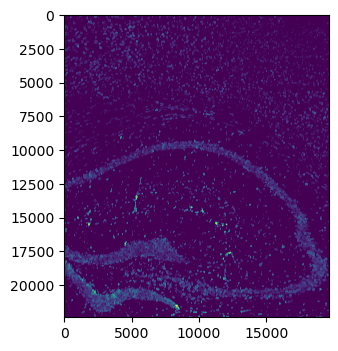

In [370]:
plt.imshow(data)

In [369]:
data.max()

65.0

## Validation 

In [371]:
adata = sc.read_h5ad('../2021-01-13-mAD-test-dataset/2020-12-27-starmap-mAD-raw.h5ad')
adata

AnnData object with n_obs × n_vars = 33106 × 2112
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', '__is_in_cluster__', 'top_level', 'cell_type', 'region', 'cell_type_label'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9494_morph', 'AD_mouse9498_morph', 'AD_mouse9723_morph', 'AD_mouse9735_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



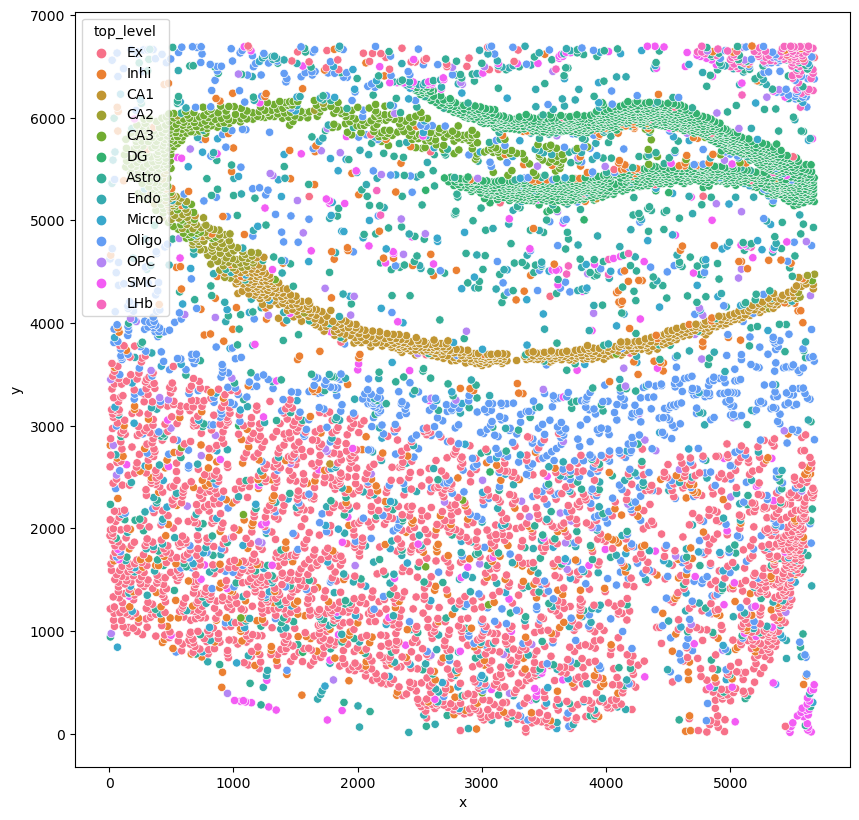

In [383]:
current_obs = adata.obs.loc[adata.obs['sample'] == 'AD_mouse9498', :]
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(current_obs['x'], current_obs['y'], hue=current_obs['top_level'])
plt.show()

## Dataset coorelation

In [420]:
# Load 2766 data
adata = sc.read_h5ad('../2020-10-09-mAD-reads-assignment/output/2020-12-27-starmap-mAD-raw.h5ad')
adata

AnnData object with n_obs × n_vars = 33106 × 2112
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', '__is_in_cluster__', 'top_level', 'cell_type', 'region', 'cell_type_label'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9494_morph', 'AD_mouse9498_morph', 'AD_mouse9723_morph', 'AD_mouse9735_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'

In [421]:
# Load adata 
vdata = sc.read_h5ad('output/2021-03-25-starmap-mAD-64-genes-raw.h5ad')
vdata

AnnData object with n_obs × n_vars = 36625 × 64
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'predicted_top_level', 'predicted_top_level_score', 'predicted_cell_type', 'predicted_cell_type_score', 'predicted_cell_type_label', 'predicted_cell_type_label_score'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells'
    uns: 'AD_mouse9721_morph', 'AD_mouse9781_morph', 'AD_mouse9919_morph', 'AD_mouse9930_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'
    layers: 'raw'

In [479]:
from scipy import stats

In [422]:
shared_genes = vdata.var.index[np.in1d(vdata.var.index, adata.var.index)]
adata = adata[:, shared_genes]
vdata = vdata[:, shared_genes]
adata

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.



View of AnnData object with n_obs × n_vars = 33106 × 63
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', '__is_in_cluster__', 'top_level', 'cell_type', 'region', 'cell_type_label'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9494_morph', 'AD_mouse9498_morph', 'AD_mouse9723_morph', 'AD_mouse9735_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'

In [481]:
adata_array = []
vdata_array = []

annotation = []
for current_label in adata.obs['top_level'].cat.categories:
    adata_expr = adata[adata.obs['top_level'] == current_label, :].X.mean(axis=0)
    adata_array.append(adata_expr)
    current_label = current_label + '_2766'
    annotation.append(current_label)
    
for current_label in adata.obs['top_level'].cat.categories:
    vdata_expr = vdata[vdata.obs['predicted_top_level'] == current_label, :].X.mean(axis=0)
    vdata_array.append(vdata_expr)
    current_label = current_label + '_64'
    annotation.append(current_label)
    
adata_array = np.array(adata_array).T
vdata_array = np.array(vdata_array).T

/Users/jiahao/anaconda3/envs/bio37/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning:

The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.



In [483]:
# co_matrix = np.corrcoef(adata_array, vdata_array)
co_matrix, pval = stats.spearmanr(adata_array, vdata_array)
co_matrix.shape

(26, 26)

In [484]:
co_df = pd.DataFrame(co_matrix, index=annotation, columns=annotation)
co_df

,Ex_2766,Inhi_2766,CA1_2766,CA2_2766,CA3_2766,DG_2766,Astro_2766,Endo_2766,Micro_2766,Oligo_2766,...,CA2_64,CA3_64,DG_64,Astro_64,Endo_64,Micro_64,Oligo_64,OPC_64,SMC_64,LHb_64
Ex_2766,1.000000,0.873794,0.903597,0.885745,0.904465,0.905075,0.764537,0.797009,0.506139,0.750492,...,0.599563,0.683772,0.628399,0.528845,0.528334,0.349063,0.508557,0.547813,0.452253,0.475527
Inhi_2766,0.873794,1.000000,0.810783,0.806950,0.819611,0.752743,0.713530,0.724425,0.442052,0.697830,...,0.515662,0.611094,0.496220,0.398776,0.386818,0.228188,0.403596,0.434881,0.316664,0.339592
CA1_2766,0.903597,0.810783,1.000000,0.944705,0.946359,0.912280,0.724776,0.755092,0.466286,0.658425,...,0.651152,0.711650,0.645663,0.527881,0.539013,0.346140,0.481643,0.537249,0.475936,0.459403
CA2_2766,0.885745,0.806950,0.944705,1.000000,0.962161,0.891163,0.731375,0.747974,0.511056,0.688770,...,0.686633,0.729062,0.644244,0.553358,0.540051,0.394253,0.514267,0.532957,0.475320,0.445593
CA3_2766,0.904465,0.819611,0.946359,0.962161,1.000000,0.900461,0.744182,0.779717,0.537320,0.709818,...,0.644035,0.747750,0.622501,0.540104,0.554067,0.391493,0.506421,0.532657,0.488244,0.448755
DG_2766,0.905075,0.752743,0.912280,0.891163,0.900461,1.000000,0.772982,0.817170,0.541869,0.719184,...,0.595238,0.665482,0.689558,0.579676,0.579837,0.407489,0.535406,0.565844,0.526855,0.486993
Astro_2766,0.764537,0.713530,0.724776,0.731375,0.744182,0.772982,1.000000,0.904550,0.622909,0.843005,...,0.508611,0.552260,0.484980,0.713881,0.605859,0.424421,0.565246,0.523998,0.593481,0.470935
Endo_2766,0.797009,0.724425,0.755092,0.747974,0.779717,0.817170,0.904550,1.000000,0.651689,0.843406,...,0.450326,0.517198,0.444183,0.570537,0.656794,0.386962,0.492043,0.478590,0.639088,0.418667
Micro_2766,0.506139,0.442052,0.466286,0.511056,0.537320,0.541869,0.622909,0.651689,1.000000,0.587243,...,0.356484,0.374932,0.360051,0.430958,0.399078,0.688804,0.361251,0.254473,0.429710,0.323211
Oligo_2766,0.750492,0.697830,0.658425,0.688770,0.709818,0.719184,0.843005,0.843406,0.587243,1.000000,...,0.446426,0.533471,0.436862,0.613753,0.589708,0.420469,0.676956,0.545857,0.546295,0.412752


<AxesSubplot:>

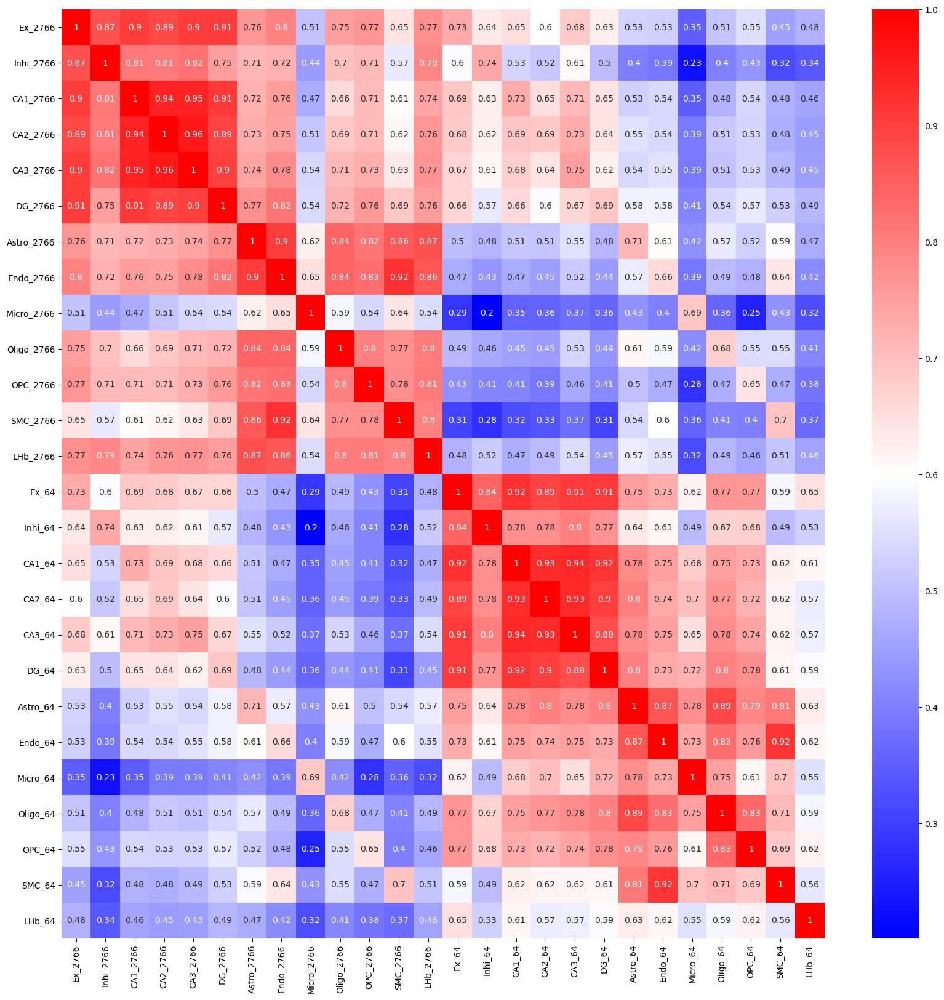

In [489]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(co_df,  cmap='bwr', annot=True)

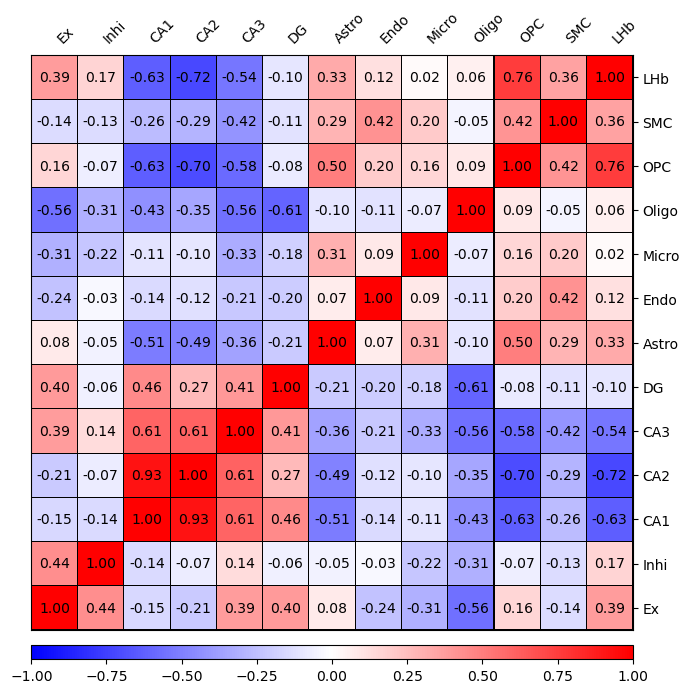

In [492]:
sc.pl.correlation_matrix(adata, groupby='top_level', dendrogram=False, show_correlation_numbers=True)

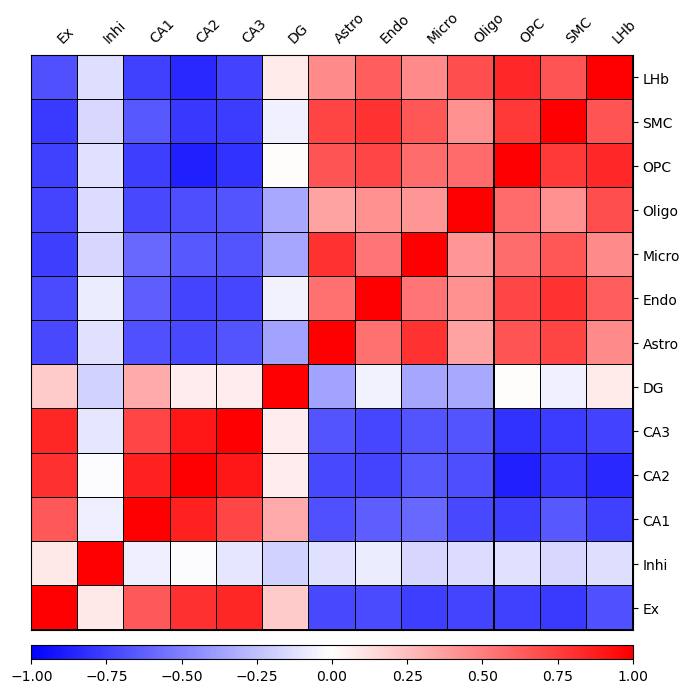

In [491]:
sc.pl.correlation_matrix(vdata, groupby='predicted_top_level', dendrogram=False)

In [ ]:
adata_array = []
vdata_array = []

annotation = []
for current_label in adata.obs['top_level'].cat.categories:
    adata_expr = adata[adata.obs['top_level'] == current_label, :].X.mean(axis=0)
    adata_array.append(adata_expr)
    current_label = current_label + '_2766'
    annotation.append(current_label)
    
for current_label in adata.obs['top_level'].cat.categories:
    vdata_expr = vdata[vdata.obs['predicted_top_level'] == current_label, :].X.mean(axis=0)
    vdata_array.append(vdata_expr)
    current_label = current_label + '_64'
    annotation.append(current_label)
    
adata_array = np.array(adata_array)
vdata_array = np.array(vdata_array)

## cell type composition 

In [605]:
# Load 2766 data
adata = sc.read_h5ad('../2020-10-09-mAD-reads-assignment/output/2020-12-27-starmap-mAD-raw.h5ad')
adata.obs['sample'] = adata.obs['sample'].cat.reorder_categories(['AD_mouse9735', 'AD_mouse9723', 'AD_mouse9498', 'AD_mouse9494'])

adata

AnnData object with n_obs × n_vars = 33106 × 2112
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'batch', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', '__is_in_cluster__', 'top_level', 'cell_type', 'region', 'cell_type_label'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells', 'mean', 'std'
    uns: 'AD_mouse9494_morph', 'AD_mouse9498_morph', 'AD_mouse9723_morph', 'AD_mouse9735_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'

In [606]:
# Load adata 
vdata = sc.read_h5ad('output/2021-03-25-starmap-mAD-64-genes-raw.h5ad')
vdata

AnnData object with n_obs × n_vars = 36625 × 64
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'predicted_top_level', 'predicted_top_level_score', 'predicted_cell_type', 'predicted_cell_type_score', 'predicted_cell_type_label', 'predicted_cell_type_label_score'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells'
    uns: 'AD_mouse9721_morph', 'AD_mouse9781_morph', 'AD_mouse9919_morph', 'AD_mouse9930_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'
    layers: 'raw'

In [611]:
adata_top_list = []
adata_sub_list = []

for sample in adata.obs['sample'].cat.categories:
    current_obs = adata.obs.loc[adata.obs['sample'] == sample, :]
    current_top_df = current_obs['top_level'].value_counts()
    adata_top_list.append(current_top_df)
    current_sub_df = current_obs['cell_type_label'].value_counts()
    adata_sub_list.append(current_sub_df)

<AxesSubplot:>

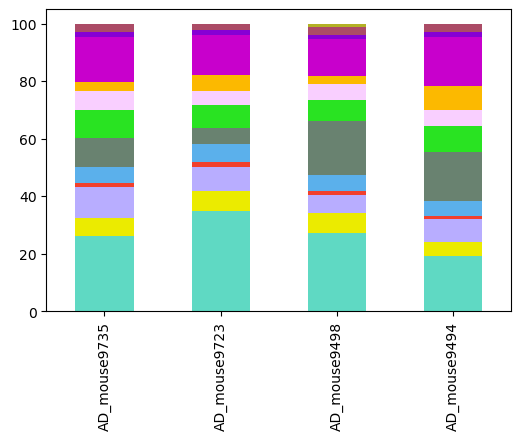

In [612]:
adata_value_counts = pd.DataFrame(adata_top_list, index=adata.obs['sample'].cat.categories)

top_pl = [adata.uns['top_hex_dict'][c] for c in adata_value_counts.columns]
top_cmap = ListedColormap(top_pl)

stacked_data = adata_value_counts.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, colormap=top_cmap, legend=False)

In [613]:
stacked_data

,Ex,Inhi,CA1,CA2,CA3,DG,Astro,Endo,Micro,Oligo,OPC,SMC,LHb
AD_mouse9735,26.122550,6.288762,10.667328,1.389233,5.544530,10.233193,9.600595,6.636070,3.349045,15.492434,1.637311,2.914909,0.124039
AD_mouse9723,34.876671,6.945019,8.212760,1.791374,6.462726,5.360342,8.143861,4.671352,5.746176,13.848698,1.598457,2.218548,0.124018
AD_mouse9498,27.285604,6.721607,6.309554,1.364924,5.627092,18.735514,7.507082,5.511203,2.845738,12.747875,1.506567,2.691218,1.146021
AD_mouse9494,19.269534,4.710109,8.063068,0.878156,5.238998,17.044207,9.340385,5.458537,8.132921,17.183914,1.836144,2.714300,0.129728


In [614]:
vdata_top_list = []
vdata_sub_list = []

for sample in vdata.obs['sample'].cat.categories:
    current_obs = vdata.obs.loc[vdata.obs['sample'] == sample, :]
    current_top_df = current_obs['predicted_top_level'].value_counts()
    vdata_top_list.append(current_top_df)
    current_sub_df = current_obs['predicted_cell_type_label'].value_counts()
    vdata_sub_list.append(current_sub_df)

<AxesSubplot:>

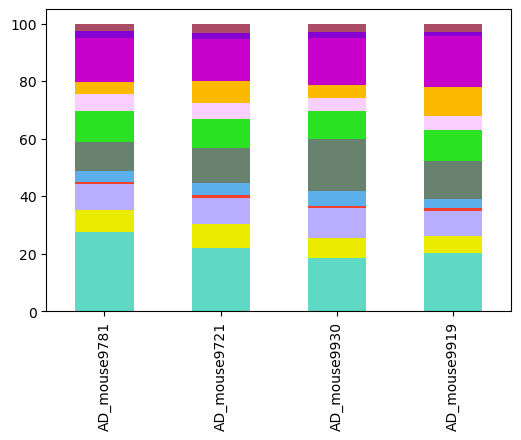

In [615]:
vdata_value_counts = pd.DataFrame(vdata_top_list, index=vdata.obs['sample'].cat.categories)

stacked_data = vdata_value_counts.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, colormap=top_cmap, legend=False)

In [616]:
stacked_data

,Ex,Inhi,CA1,CA2,CA3,DG,Astro,Endo,Micro,Oligo,OPC,SMC,LHb
AD_mouse9781,27.433900,7.634761,9.079729,0.584136,4.047961,10.084034,10.873130,5.595409,4.355401,15.290018,2.285304,2.736216,0.000000
AD_mouse9721,21.818390,8.518688,8.851181,1.112130,4.288007,12.233433,10.009172,5.560651,7.521211,14.813116,1.949094,3.313460,0.011465
AD_mouse9930,18.451762,7.024841,10.444830,0.808781,4.968226,18.266898,9.589832,4.656268,4.413634,16.268053,2.079723,3.027152,0.000000
AD_mouse9919,20.179136,5.995785,8.566913,0.969442,3.424658,12.918862,10.853530,5.089568,9.905163,17.608008,1.717597,2.771338,0.000000


## Cell type composition per top-level

In [577]:
# Load 2766 data
adata = sc.read_h5ad('../2020-10-09-mAD-reads-assignment/output/2020-12-27-starmap-mAD-raw.h5ad')
adata.obs['sample'] = adata.obs['sample'].cat.reorder_categories(['AD_mouse9735', 'AD_mouse9723', 'AD_mouse9498', 'AD_mouse9494'])


# Load adata 
vdata = sc.read_h5ad('output/2021-03-25-starmap-mAD-64-genes-raw.h5ad')
vdata

AnnData object with n_obs × n_vars = 36625 × 64
    obs: 'orig_index', 'sample', 'area', 'tau', 'x', 'y', 'time', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'predicted_top_level', 'predicted_top_level_score', 'predicted_cell_type', 'predicted_cell_type_score', 'predicted_cell_type_label', 'predicted_cell_type_label_score'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'max_counts', 'n_cells'
    uns: 'AD_mouse9721_morph', 'AD_mouse9781_morph', 'AD_mouse9919_morph', 'AD_mouse9930_morph', 'cell_type_label', 'cell_type_order', 'label_hex_dict', 'label_rgb_dict', 'sub_hex_dict', 'sub_rgb_dict', 'top_hex_dict', 'top_level_order', 'top_rgb_dict'
    layers: 'raw'

In [599]:
groups = ['OL1', 'OL2', 'OL3']

adata_sub_list = []

for sample in adata.obs['sample'].cat.categories:
    current_obs = adata.obs.loc[adata.obs['sample'] == sample, :]
    current_obs = current_obs.loc[current_obs['cell_type_label'].isin(groups), :]
    current_sub_df = current_obs['cell_type_label'].value_counts()
    adata_sub_list.append(current_sub_df)
    

<AxesSubplot:>

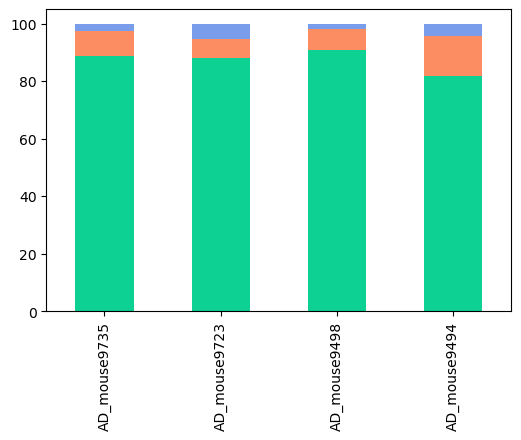

In [600]:
adata_value_counts = pd.DataFrame(adata_sub_list, index=adata.obs['sample'].cat.categories)

sub_pl = [adata.uns['label_hex_dict'][c] for c in adata_value_counts.columns]
sub_cmap = ListedColormap(sub_pl)

stacked_data = adata_value_counts.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, colormap=sub_cmap, legend=False)

In [601]:
stacked_data.loc[:, groups]

,OL1,OL2,OL3
AD_mouse9735,88.710969,8.726982,2.562050
AD_mouse9723,87.860697,6.666667,5.472637
AD_mouse9498,90.808081,7.171717,2.020202
AD_mouse9494,81.591173,14.111498,4.297329


In [602]:
vdata_sub_list = []

for sample in vdata.obs['sample'].cat.categories:
    current_obs = vdata.obs.loc[vdata.obs['sample'] == sample, :]
    current_obs = current_obs.loc[current_obs['predicted_cell_type_label'].isin(groups), :]
    current_sub_df = current_obs['predicted_cell_type_label'].value_counts()
    vdata_sub_list.append(current_sub_df)

<AxesSubplot:>

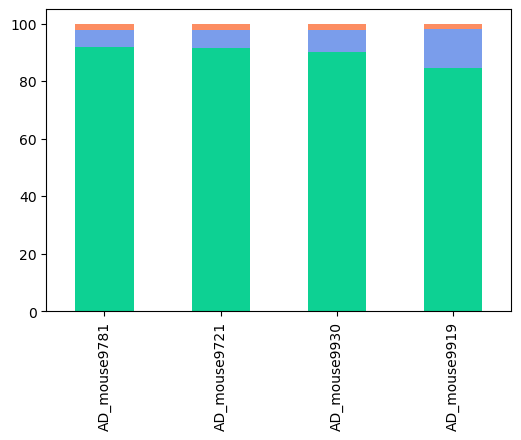

In [603]:
vdata_value_counts = pd.DataFrame(vdata_sub_list, index=vdata.obs['sample'].cat.categories)

sub_pl = [vdata.uns['label_hex_dict'][c] for c in vdata_value_counts.columns]
sub_cmap = ListedColormap(sub_pl)

stacked_data = vdata_value_counts.apply(lambda x: x*100/sum(x), axis=1)
stacked_data.plot(kind="bar", stacked=True, colormap=sub_cmap, legend=False)

In [604]:
stacked_data.loc[:, groups]

,OL1,OL2,OL3
AD_mouse9781,91.876209,2.192134,5.931657
AD_mouse9721,91.532847,2.189781,6.277372
AD_mouse9930,90.221914,2.357836,7.420250
AD_mouse9919,84.565728,1.995305,13.438967
